In [1]:
import csv
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import glob
import os
from functools import reduce
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.model_selection import train_test_split,GridSearchCV,RandomizedSearchCV
from sklearn.linear_model import LinearRegression,Lasso,Ridge
from sklearn.metrics import r2_score,mean_squared_error
from sklearn.ensemble import RandomForestRegressor,GradientBoostingRegressor
from sklearn.tree import DecisionTreeRegressor
from IPython.display import display
from scipy.stats import uniform as sp_randFloat
from scipy.stats import randint as sp_randInt 
from sklearn.model_selection import cross_val_score
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
import datetime

In [2]:
data_all = pd.read_csv('data_all.csv')
data_all.head()

,location,Date,PM25,Lat,Long,NDVI_8000_mean,QA_8000_mean,TIMEOFDAY_8000_mean,NDVI_8000_min,QA_8000_min,...,0_NO2_column_number_density,0_NO2_slant_column_number_density,0_stratospheric_NO2_column_number_density,0_tropopause_pressure,0_tropospheric_NO2_column_number_density,1_O3_column_number_density,2_CO_column_number_density,2_H2O_column_number_density,2_cloud_height,3_absorbing_aerosol_index
0,Aberdeen,2018-09-27,3.294118,57.15736,-2.094278,1220.846695,-310.897349,1556.695652,-288.0,-32632.0,...,0.000084,0.000163,0.000041,11804.879928,0.000051,0.111958,0.028983,1477.630239,557.602175,-1.259474
1,Aberdeen,2018-09-28,3.952381,57.15736,-2.094278,1220.846695,-310.897349,1556.695652,-288.0,-32632.0,...,0.000101,0.000170,0.000041,13526.737539,0.000058,0.116510,0.028686,1150.147929,342.525465,-1.152045
2,Aberdeen,2018-09-29,4.666667,57.15736,-2.094278,1220.846695,-310.897349,1556.695652,-288.0,-32632.0,...,0.000099,0.000190,0.000042,14236.928847,0.000062,0.134758,0.032286,526.551019,67.268342,-0.980849
3,Aberdeen,2018-09-30,3.941176,57.15736,-2.094278,1220.846695,-310.897349,1556.695652,-288.0,-32632.0,...,0.000098,0.000237,0.000045,13148.895225,0.000061,0.127893,0.030695,647.729301,317.475332,-0.620365
4,Aberdeen,2018-10-01,4.684211,57.15736,-2.094278,1220.846695,-310.897349,1556.695652,-288.0,-32632.0,...,0.000096,0.000190,0.000047,17957.345864,0.000056,0.139736,0.031018,608.313814,1056.656916,-0.578224


In [3]:
ML_training = data_all.iloc[:28463]
ML_training.head(-5)

,location,Date,PM25,Lat,Long,NDVI_8000_mean,QA_8000_mean,TIMEOFDAY_8000_mean,NDVI_8000_min,QA_8000_min,...,0_NO2_column_number_density,0_NO2_slant_column_number_density,0_stratospheric_NO2_column_number_density,0_tropopause_pressure,0_tropospheric_NO2_column_number_density,1_O3_column_number_density,2_CO_column_number_density,2_H2O_column_number_density,2_cloud_height,3_absorbing_aerosol_index
0,Aberdeen,2018-09-27,3.294118,57.15736,-2.094278,1220.846695,-310.897349,1556.695652,-288.0,-32632.0,...,0.000084,0.000163,0.000041,11804.879928,0.000051,0.111958,0.028983,1477.630239,557.602175,-1.259474
1,Aberdeen,2018-09-28,3.952381,57.15736,-2.094278,1220.846695,-310.897349,1556.695652,-288.0,-32632.0,...,0.000101,0.000170,0.000041,13526.737539,0.000058,0.116510,0.028686,1150.147929,342.525465,-1.152045
2,Aberdeen,2018-09-29,4.666667,57.15736,-2.094278,1220.846695,-310.897349,1556.695652,-288.0,-32632.0,...,0.000099,0.000190,0.000042,14236.928847,0.000062,0.134758,0.032286,526.551019,67.268342,-0.980849
3,Aberdeen,2018-09-30,3.941176,57.15736,-2.094278,1220.846695,-310.897349,1556.695652,-288.0,-32632.0,...,0.000098,0.000237,0.000045,13148.895225,0.000061,0.127893,0.030695,647.729301,317.475332,-0.620365
4,Aberdeen,2018-10-01,4.684211,57.15736,-2.094278,1220.846695,-310.897349,1556.695652,-288.0,-32632.0,...,0.000096,0.000190,0.000047,17957.345864,0.000056,0.139736,0.031018,608.313814,1056.656916,-0.578224
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28453,London Eltham,2021-03-22,9.958333,51.45258,0.070766,4925.281690,16512.000000,1593.000000,4197.0,16512.0,...,0.000104,0.000142,0.000036,16077.959788,0.000056,0.147265,0.038448,608.595185,1400.413644,-1.585955
28454,London Eltham,2021-03-23,15.541667,51.45258,0.070766,4925.281690,16512.000000,1593.000000,4197.0,16512.0,...,0.000123,0.000162,0.000036,14741.567270,0.000079,0.153432,0.036353,604.177271,1252.365409,-1.859305
28455,London Eltham,2021-03-24,17.411765,51.45258,0.070766,4925.281690,16512.000000,1593.000000,4197.0,16512.0,...,0.000098,0.000161,0.000039,15633.904103,0.000074,0.145494,0.036430,564.705785,1264.139700,-1.492373
28456,London Eltham,2021-03-25,9.666667,51.45258,0.070766,4925.281690,16512.000000,1593.000000,4197.0,16512.0,...,0.000089,0.000177,0.000044,18535.049038,0.000059,0.164169,0.036447,641.863654,982.729143,-1.195492


In [4]:
# ML_training.iloc[28442:28462]
data_all

,location,Date,PM25,Lat,Long,NDVI_8000_mean,QA_8000_mean,TIMEOFDAY_8000_mean,NDVI_8000_min,QA_8000_min,...,0_NO2_column_number_density,0_NO2_slant_column_number_density,0_stratospheric_NO2_column_number_density,0_tropopause_pressure,0_tropospheric_NO2_column_number_density,1_O3_column_number_density,2_CO_column_number_density,2_H2O_column_number_density,2_cloud_height,3_absorbing_aerosol_index
0,Aberdeen,2018-09-27,3.294118,57.157360,-2.094278,1220.846695,-310.897349,1556.695652,-288.0,-32632.0,...,0.000084,0.000163,0.000041,11804.879928,0.000051,0.111958,0.028983,1477.630239,557.602175,-1.259474
1,Aberdeen,2018-09-28,3.952381,57.157360,-2.094278,1220.846695,-310.897349,1556.695652,-288.0,-32632.0,...,0.000101,0.000170,0.000041,13526.737539,0.000058,0.116510,0.028686,1150.147929,342.525465,-1.152045
2,Aberdeen,2018-09-29,4.666667,57.157360,-2.094278,1220.846695,-310.897349,1556.695652,-288.0,-32632.0,...,0.000099,0.000190,0.000042,14236.928847,0.000062,0.134758,0.032286,526.551019,67.268342,-0.980849
3,Aberdeen,2018-09-30,3.941176,57.157360,-2.094278,1220.846695,-310.897349,1556.695652,-288.0,-32632.0,...,0.000098,0.000237,0.000045,13148.895225,0.000061,0.127893,0.030695,647.729301,317.475332,-0.620365
4,Aberdeen,2018-10-01,4.684211,57.157360,-2.094278,1220.846695,-310.897349,1556.695652,-288.0,-32632.0,...,0.000096,0.000190,0.000047,17957.345864,0.000056,0.139736,0.031018,608.313814,1056.656916,-0.578224
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
60853,York Fishergate,2021-05-03,5.900000,53.951889,-1.075861,4161.751108,16514.663220,1519.873708,3895.0,16512.0,...,0.000120,0.000181,0.000058,21527.920556,0.000043,0.171864,0.035553,650.434315,2271.625894,-1.472800
60854,York Fishergate,2021-05-04,1.000000,53.951889,-1.075861,4161.751108,16514.663220,1519.873708,3895.0,16512.0,...,0.000115,0.000164,0.000055,19994.449322,0.000043,0.170350,0.035032,755.791934,2406.136584,-1.220639
60855,York Fishergate,2021-05-05,1.000000,53.951889,-1.075861,4161.751108,16514.663220,1519.873708,3895.0,16512.0,...,0.000085,0.000161,0.000059,20991.549605,0.000037,0.171008,0.033779,728.122242,2306.977735,-1.825140
60856,York Fishergate,2021-05-06,0.956522,53.951889,-1.075861,4161.751108,16514.663220,1519.873708,3895.0,16512.0,...,0.000097,0.000228,0.000066,21165.726652,0.000037,0.179997,0.034395,671.980579,2617.436907,-1.265253


In [5]:
X = ML_training.drop(['location', 'Lat', 'Long', 'PM25', 'Lat_y', 'Long_y'], axis = 1)

In [6]:
y = ML_training['PM25']

In [10]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Attempt 1

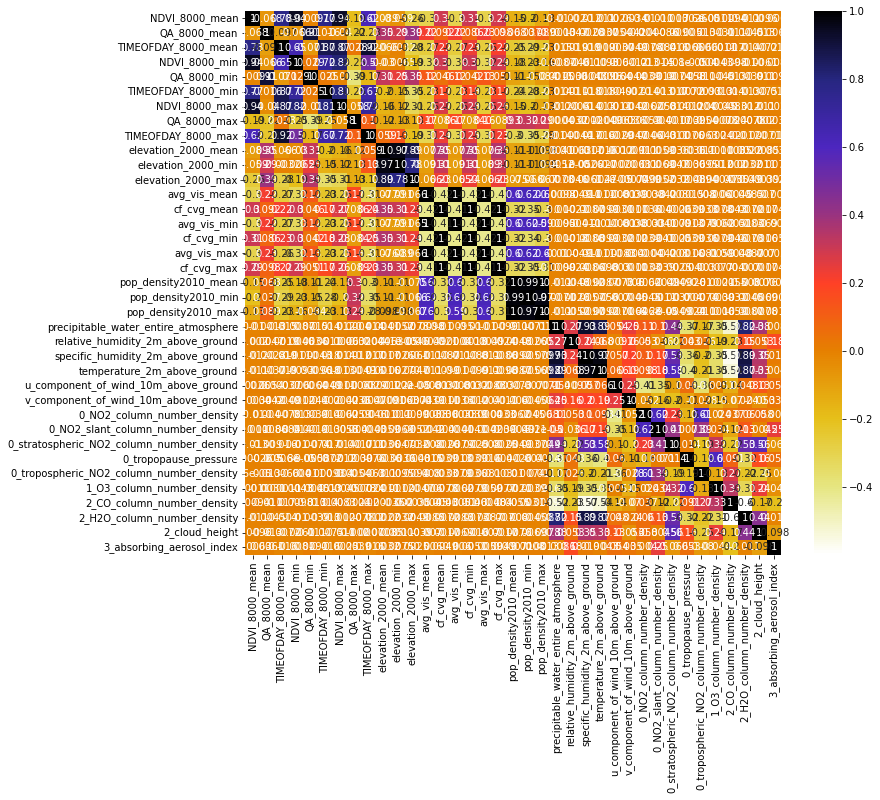

In [36]:
import seaborn as sns
#Using Pearson Correlation
plt.figure(figsize=(12,10))
cor = X_train.corr()
sns.heatmap(cor, annot=True, cmap=plt.cm.CMRmap_r)
plt.show()

In [37]:
# with the following function we can select highly correlated features
# it will remove the first feature that is correlated with anything other feature

def correlation(dataset, threshold):
    col_corr = set()  # Set of all the names of correlated columns
    corr_matrix = dataset.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if (corr_matrix.iloc[i, j]) > threshold: # we are interested in absolute coeff value
                colname = corr_matrix.columns[i]  # getting the name of column
                col_corr.add(colname)
    return col_corr

In [38]:
corr_features = correlation(X_train, 0.8)
len(set(corr_features))

16

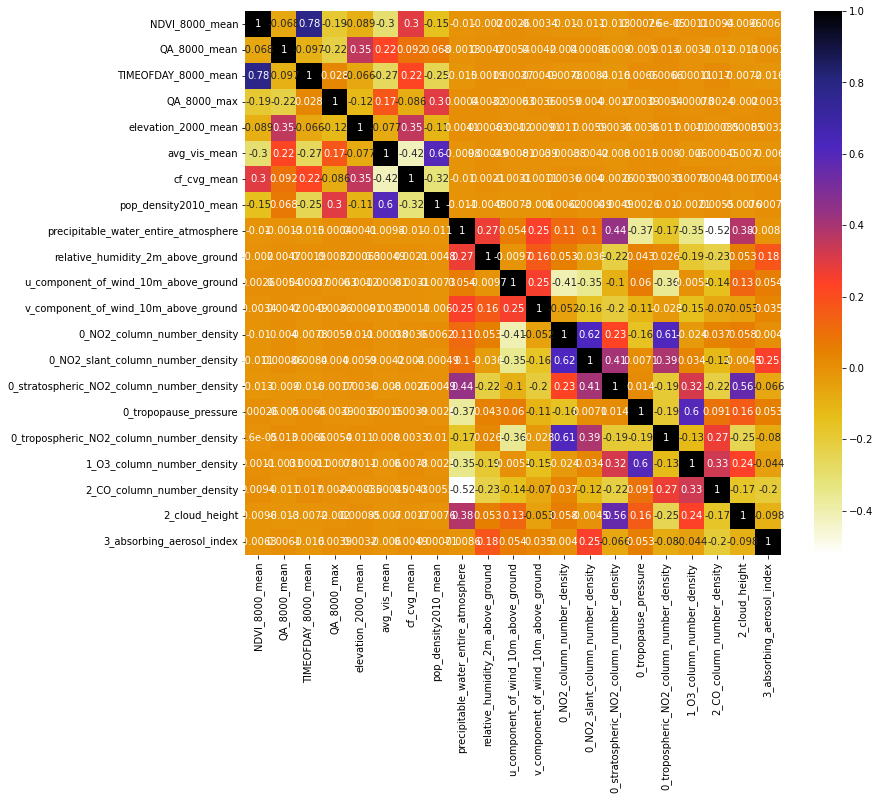

In [39]:
plt.figure(figsize=(12,10))
cor = X_train.drop(corr_features,axis=1).corr()
sns.heatmap(cor, annot=True, cmap=plt.cm.CMRmap_r)
plt.show()

In [42]:
from sklearn.feature_selection import RFE
from sklearn import metrics

def randomForest(X_train, X_test, y_train, y_test):
    clf = RandomForestRegressor(n_estimators= 100, random_state= 100, n_jobs = -1)
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)
    print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred))
    print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred))
    print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))
    print('R2 score: ', metrics.r2_score(y_test, y_pred))

In [43]:
sel = RFE(GradientBoostingRegressor(n_estimators= 100, random_state= 0), n_features_to_select = 12)
sel.fit(X_train.drop(corr_features,axis=1), y_train)
X_train_rfe = sel.transform(X_train.drop(corr_features,axis=1))
X_test_rfe = sel.transform(X_test.drop(corr_features,axis=1))
# print('Selected Feature: ', i)
randomForest(X_train_rfe, X_test_rfe, y_train, y_test)
print()

Mean Absolute Error: 2.2269315502803226
Mean Squared Error: 12.775956997406132
Root Mean Squared Error: 3.574347072880043
R2 score:  0.7180594901955155



In [55]:
test_data_all = pd.read_csv('test_data_all.csv')
test_data_all = test_data_all.drop('Unnamed: 0', axis = 1)
test_data_all = test_data_all.fillna(76.3)

In [56]:
test_data_all.columns

Index(['location', 'Date', 'city', 'country', 'Lat', 'Long', 'NDVI_8000_mean',
       'QA_8000_mean', 'TIMEOFDAY_8000_mean', 'NDVI_8000_min', 'QA_8000_min',
       'TIMEOFDAY_8000_min', 'NDVI_8000_max', 'QA_8000_max',
       'TIMEOFDAY_8000_max', 'elevation_2000_mean', 'elevation_2000_min',
       'elevation_2000_max', 'avg_vis_mean', 'cf_cvg_mean', 'avg_vis_min',
       'cf_cvg_min', 'avg_vis_max', 'cf_cvg_max', 'pop_density2010_mean',
       'pop_density2010_min', 'pop_density2010_max',
       'precipitable_water_entire_atmosphere',
       'relative_humidity_2m_above_ground',
       'specific_humidity_2m_above_ground', 'temperature_2m_above_ground',
       'u_component_of_wind_10m_above_ground',
       'v_component_of_wind_10m_above_ground', '0_NO2_column_number_density',
       '0_NO2_slant_column_number_density',
       '0_stratospheric_NO2_column_number_density', '0_tropopause_pressure',
       '0_tropospheric_NO2_column_number_density',
       '1_O3_column_number_density', '2_CO_

In [58]:
X_test_PM25 = test_data_all.drop(['location', 'Date', 'city', 'country', 'Lat', 'Long'], axis = 1)

In [60]:
X_test_PM25_transform = sel.transform(X_test_PM25.drop(corr_features,axis=1))

In [62]:
clf = RandomForestRegressor(n_estimators= 100, random_state= 100, n_jobs = -1)
clf.fit(X_train_rfe, y_train)
y_pred = clf.predict(X_test_PM25_transform)

In [65]:
coordinates = pd.read_csv('Coordinates_updated_long.csv')
predict_pm25 = pd.DataFrame(y_pred, columns = ['Predicted PM25'])
correlation = pd.DataFrame.join(predict_pm25, coordinates['location'])
correlation_groupby = correlation.groupby('location',sort = False, as_index=False).mean(lambda x: set(x))

In [67]:
respiratory = [749,721,797,935,926,610,845,708,554,680,655,652,736,553,585,
618,637,711,823,639,806,808,1087,689,651,681,628,615,608,676,619,573,835,733,
733,896,681,941,863,600,567,739,850,852,859,]
respiratory_disease = pd.DataFrame(respiratory, columns = ['Respiratory'])
correlation_groupby = correlation_groupby.join(respiratory_disease)

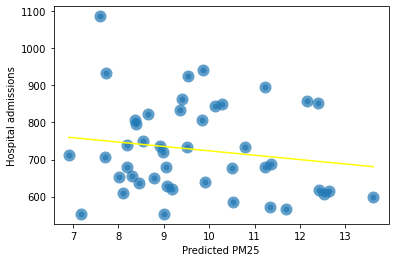

In [71]:
x = correlation_groupby['Predicted PM25']
y = correlation_groupby['Respiratory']
plt.scatter(x = x, y = y, lw = 6, alpha = 0.7)
plt.xlabel('Predicted PM25')
plt.ylabel('Hospital admissions')
plt.plot(np.unique(x), np.poly1d(np.polyfit(x, y, 1))(np.unique(x)), color = 'yellow')

In [73]:
from scipy.stats import pearsonr
pearsonr(correlation_groupby['Predicted PM25'],
         correlation_groupby['Respiratory'])[0]

-0.15814442635996223

In [81]:
import pandas as pd
std = np.std([tree.feature_importances_ for tree in clf.estimators_], axis=0)
importances = clf.feature_importances_
forest_importances = pd.Series(importances, index= X_train_rfe.columns)

fig, ax = plt.subplots()
forest_importances.plot.bar(yerr=std, ax=ax)
ax.set_title("Feature importances using MDI")
ax.set_ylabel("Mean decrease in impurity")
fig.tight_layout()

AttributeError: 'numpy.ndarray' object has no attribute 'columns'

# Attempt 2

In [7]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [8]:
X_train.columns

Index(['Date', 'NDVI_8000_mean', 'QA_8000_mean', 'TIMEOFDAY_8000_mean',
       'NDVI_8000_min', 'QA_8000_min', 'TIMEOFDAY_8000_min', 'NDVI_8000_max',
       'QA_8000_max', 'TIMEOFDAY_8000_max', 'elevation_2000_mean',
       'elevation_2000_min', 'elevation_2000_max', 'avg_vis_mean',
       'cf_cvg_mean', 'avg_vis_min', 'cf_cvg_min', 'avg_vis_max', 'cf_cvg_max',
       'pop_density2010_mean', 'pop_density2010_min', 'pop_density2010_max',
       'precipitable_water_entire_atmosphere',
       'relative_humidity_2m_above_ground',
       'specific_humidity_2m_above_ground', 'temperature_2m_above_ground',
       'u_component_of_wind_10m_above_ground',
       'v_component_of_wind_10m_above_ground', '0_NO2_column_number_density',
       '0_NO2_slant_column_number_density',
       '0_stratospheric_NO2_column_number_density', '0_tropopause_pressure',
       '0_tropospheric_NO2_column_number_density',
       '1_O3_column_number_density', '2_CO_column_number_density',
       '2_H2O_column_number_d

In [9]:
X_train = X_train.drop(['TIMEOFDAY_8000_mean','TIMEOFDAY_8000_min','TIMEOFDAY_8000_max',
                       'NDVI_8000_min', 'QA_8000_min','NDVI_8000_max','QA_8000_max',
                       'elevation_2000_min', 'elevation_2000_max','avg_vis_min', 'cf_cvg_min', 'avg_vis_max', 'cf_cvg_max',
                       'pop_density2010_min', 'pop_density2010_max'], axis = 1)


In [10]:
X_train = X_train.rename(columns={'NDVI_8000_mean': 'NDVI', 'QA_8000_mean': 'QA', 'elevation_2000_mean': 'Elevation', 'avg_vis_mean': 'Avg',
       'cf_cvg_mean': 'CF_avg', 'pop_density2010_mean': 'Population Density',
       'precipitable_water_entire_atmosphere': 'Precipitable Water',
       'relative_humidity_2m_above_ground': 'RH',
       'specific_humidity_2m_above_ground': 'SH', 'temperature_2m_above_ground': 'Temperature',
       'u_component_of_wind_10m_above_ground': 'U Wind',
       'v_component_of_wind_10m_above_ground': 'V Wind', '0_NO2_column_number_density': 'NO2 Column',
       '0_NO2_slant_column_number_density': 'NO2 Slant',
       '0_stratospheric_NO2_column_number_density': 'NO2 Strat', '0_tropopause_pressure': 'Pressure',
       '0_tropospheric_NO2_column_number_density': 'NO2 Trop',
       '1_O3_column_number_density': 'O3', '2_CO_column_number_density': 'CO',
       '2_H2O_column_number_density': 'H2O', '2_cloud_height': 'Cloud',
       '3_absorbing_aerosol_index': 'Aerosol'})

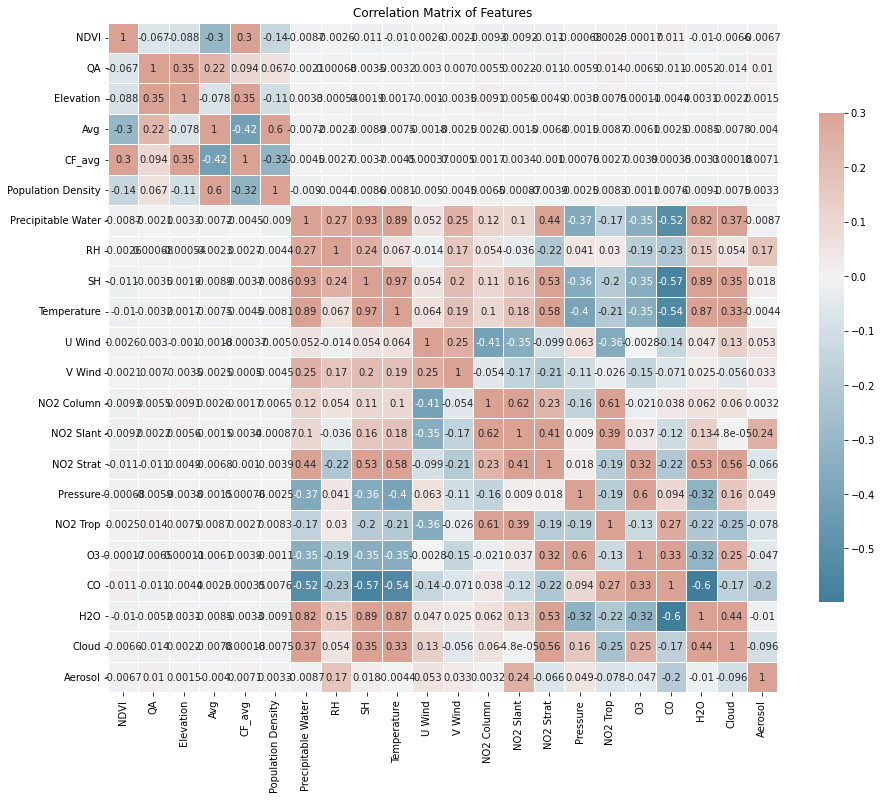

In [23]:
corr = X_train.corr()

f, ax = plt.subplots(figsize=(15, 18))

# Colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Correlation matrix with correct size and colormap
sns.heatmap(corr, cmap = cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot = True)
plt.title('Correlation Matrix of Features');

In [12]:
# with the following function we can select highly correlated features
# it will remove the first feature that is correlated with anything other feature

def correlation(dataset, threshold):
    col_corr = set()  # Set of all the names of correlated columns
    corr_matrix = dataset.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if (corr_matrix.iloc[i, j]) > threshold: # we are interested in absolute coeff value
                colname = corr_matrix.columns[i]  # getting the name of column
                col_corr.add(colname)
    return col_corr

In [13]:
corr_features = correlation(X_train, 0.8)
len(set(corr_features))

3

In [14]:
corr_features

{'H2O', 'SH', 'Temperature'}

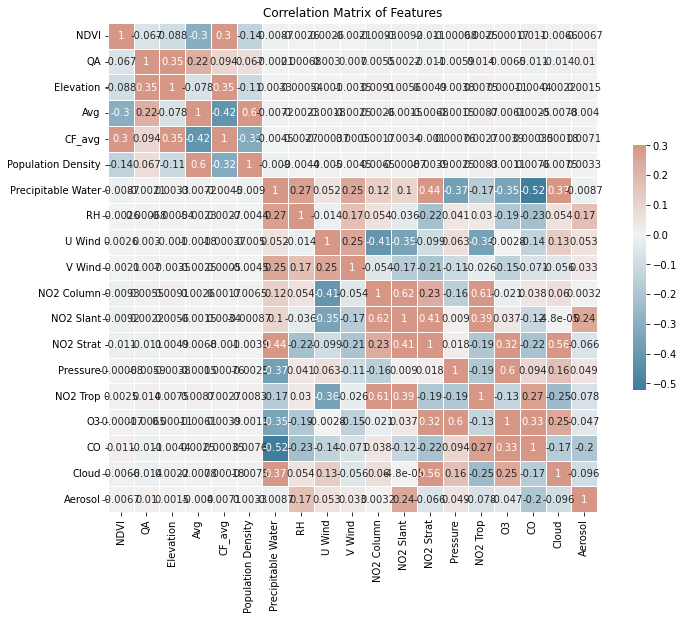

In [15]:
corr = X_train.drop(corr_features, axis = 1).corr()
#mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(13, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, cmap = cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot = True)
plt.title('Correlation Matrix of Features');

In [16]:
X_train = X_train.drop(corr_features, axis = 1)

In [17]:
X_test = X_test.drop(['TIMEOFDAY_8000_mean','TIMEOFDAY_8000_min','TIMEOFDAY_8000_max',
                       'NDVI_8000_min', 'QA_8000_min','NDVI_8000_max','QA_8000_max',
                       'elevation_2000_min', 'elevation_2000_max','avg_vis_min', 'cf_cvg_min', 'avg_vis_max', 'cf_cvg_max',
                       'pop_density2010_min', 'pop_density2010_max'], axis = 1)

In [18]:
X_test = X_test.rename(columns={'NDVI_8000_mean': 'NDVI', 'QA_8000_mean': 'QA', 'elevation_2000_mean': 'Elevation', 'avg_vis_mean': 'Avg',
       'cf_cvg_mean': 'CF_avg', 'pop_density2010_mean': 'Population Density',
       'precipitable_water_entire_atmosphere': 'Precipitable Water',
       'relative_humidity_2m_above_ground': 'RH',
       'specific_humidity_2m_above_ground': 'SH', 'temperature_2m_above_ground': 'Temperature',
       'u_component_of_wind_10m_above_ground': 'U Wind',
       'v_component_of_wind_10m_above_ground': 'V Wind', '0_NO2_column_number_density': 'NO2 Column',
       '0_NO2_slant_column_number_density': 'NO2 Slant',
       '0_stratospheric_NO2_column_number_density': 'NO2 Strat', '0_tropopause_pressure': 'Pressure',
       '0_tropospheric_NO2_column_number_density': 'NO2 Trop',
       '1_O3_column_number_density': 'O3', '2_CO_column_number_density': 'CO',
       '2_H2O_column_number_density': 'H2O', '2_cloud_height': 'Cloud',
       '3_absorbing_aerosol_index': 'Aerosol'})

In [19]:
X_test = X_test.drop(corr_features, axis = 1)

In [20]:
test_data_all = pd.read_csv('test_data_all.csv')
test_data_all = test_data_all.drop('Unnamed: 0', axis = 1)
test_data_all = test_data_all.fillna(76.3)

In [21]:
X_test_coord = test_data_all.drop(['location', 'Date', 'city', 'country'], axis = 1)

In [22]:
X_test_coord = X_test_coord.drop(['TIMEOFDAY_8000_mean','TIMEOFDAY_8000_min','TIMEOFDAY_8000_max',
                       'NDVI_8000_min', 'QA_8000_min','NDVI_8000_max','QA_8000_max',
                       'elevation_2000_min', 'elevation_2000_max','avg_vis_min', 'cf_cvg_min', 'avg_vis_max', 'cf_cvg_max',
                       'pop_density2010_min', 'pop_density2010_max'], axis = 1)


In [27]:
X_test_coord = X_test_coord.drop(corr_features, axis =1)

KeyError: "['H2O' 'Temperature' 'SH'] not found in axis"

In [28]:
X_test_coord = X_test_coord.rename(columns={'NDVI_8000_mean': 'NDVI', 'QA_8000_mean': 'QA', 'elevation_2000_mean': 'Elevation', 'avg_vis_mean': 'Avg',
       'cf_cvg_mean': 'CF_avg', 'pop_density2010_mean': 'Population Density',
       'precipitable_water_entire_atmosphere': 'Precipitable Water',
       'relative_humidity_2m_above_ground': 'RH',
       'specific_humidity_2m_above_ground': 'SH', 'temperature_2m_above_ground': 'Temperature',
       'u_component_of_wind_10m_above_ground': 'U Wind',
       'v_component_of_wind_10m_above_ground': 'V Wind', '0_NO2_column_number_density': 'NO2 Column',
       '0_NO2_slant_column_number_density': 'NO2 Slant',
       '0_stratospheric_NO2_column_number_density': 'NO2 Strat', '0_tropopause_pressure': 'Pressure',
       '0_tropospheric_NO2_column_number_density': 'NO2 Trop',
       '1_O3_column_number_density': 'O3', '2_CO_column_number_density': 'CO',
       '2_H2O_column_number_density': 'H2O', '2_cloud_height': 'Cloud',
       '3_absorbing_aerosol_index': 'Aerosol'})

In [29]:
X_train.shape, X_test.shape, X_test_coord.shape

((22770, 20), (5693, 20), (464, 21))

In [30]:
X_train.columns

Index(['Date', 'NDVI', 'QA', 'Elevation', 'Avg', 'CF_avg',
       'Population Density', 'Precipitable Water', 'RH', 'U Wind', 'V Wind',
       'NO2 Column', 'NO2 Slant', 'NO2 Strat', 'Pressure', 'NO2 Trop', 'O3',
       'CO', 'Cloud', 'Aerosol'],
      dtype='object')

# Decision Tree

In [33]:
pipe_tree = Pipeline([
        ('scale', StandardScaler()), ('tree', DecisionTreeRegressor())])

#hypterparameter tuning
grid_params = {'tree__max_depth':[3,4,5,6,7],
               'tree__max_features':['auto','sqrt','log2'],
         'tree__min_samples_split':[2,3,4,5,6,7,8,9,10],
         'tree__min_samples_leaf':[2,3,4,5,6,7,8,9,10]}   
     
tree_search = GridSearchCV(pipe_tree, grid_params, verbose=1, cv=5, n_jobs=-1)

In [ ]:
# Hyperparameter tuning
grid_params = {'tree__max_depth':[3,4,5,6,7],
               'tree__max_features':['auto','sqrt','log2'],
         'tree__min_samples_split':[2,3,4,5,6,7,8,9,10],
         'tree__min_samples_leaf':[2,3,4,5,6,7,8,9,10]}  

from sklearn.tree import DecisionTreeRegressor
pipe_tree = Pipeline([
        ('scale', StandardScaler()), ('tree', DecisionTreeRegressor())])
dtree_search = GridSearchCV(pipe_tree, grid_params, verbose=1, cv=5, n_jobs=-1)

# Training the model
dtree_search.fit(X_train.drop('Date', axis = 1), y_train)

In [34]:
import time
start_time = time.time()
# tree_search.fit(X_train.drop('Date', axis = 1), y_train.values.ravel())
tree_search.fit(X_train.drop('Date', axis = 1),y_train.values.ravel())
print("--- %s seconds ---" % (time.time() - start_time))

Fitting 5 folds for each of 1215 candidates, totalling 6075 fits
--- 38.2830650806427 seconds ---


In [35]:
print('Best parameters found:')
display(tree_search.best_params_)

Best parameters found:


{'tree__max_depth': 7,
 'tree__max_features': 'auto',
 'tree__min_samples_leaf': 5,
 'tree__min_samples_split': 2}

In [37]:
print('Score on train data: {}\n'.format(tree_search.score(X_train.drop('Date', axis = 1),y_train)))

Score on train data: 0.5341582716273351



In [38]:
print('best cv score:')
display(tree_search.best_score_)

print('mean cv score:')
display(np.mean(tree_search.cv_results_["mean_test_score"]))

best cv score:


0.47510459021878076

mean cv score:


0.31595306713778615

In [49]:
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
dtree_rmse = np.sqrt(mean_squared_error(tree_ytrain_pred ,  y_train.values.ravel()))
dtree_r2 = r2_score(tree_ytrain_pred ,  y_train.values.ravel())
dtree_mae = mean_absolute_error(tree_ytrain_pred ,  y_train.values.ravel())
dtree_mse = mean_squared_error(tree_ytrain_pred ,  y_train.values.ravel())
print("RMSE: %.2f" % dtree_rmse)
print("MSE: %.2f" % dtree_mse)
print("MAE: %.2f" % dtree_mae)
print("R2: %.2f" % dtree_r2)

RMSE: 4.51
MSE: 20.30
MAE: 2.97
R2: 0.13


In [53]:
import plotly.express as px
y_test_outlier = pd.DataFrame(y_test)
y_test_outlier = y_test_outlier.reset_index()
y_pred_dtree_df = pd.DataFrame(y_pred_dtree, columns = ['Dtree'])
dtree_outlier = pd.DataFrame.join(y_test_outlier, y_pred_dtree_df).reset_index()


#
df = dtree_outlier
fig = px.scatter(df, x='PM25', y='Dtree', trendline="ols", trendline_color_override = 'red',
                labels={
                     "Dtree": " Predicted PM 2.5 Concentration (μg/m3)",
                     "PM25": "Ground Measurement PM 2.5 (μg/m3)"})

fig.update_layout(title_text='Decision Tree PM 2.5 Concentration against Ground Measurements')
fig.show()

In [41]:
y_test.shape, y_pred_dtree.shape

((5693,), (5693,))

In [42]:
y_pred_dtree_coord = tree_search.predict(X_test_coord)

In [40]:
y_pred_dtree = tree_search.predict(X_test.drop('Date', axis =1))

In [43]:
tree_best_estim = tree_search.best_estimator_
print(tree_best_estim)

Pipeline(steps=[('scale', StandardScaler()),
                ('tree',
                 DecisionTreeRegressor(max_depth=7, max_features='auto',
                                       min_samples_leaf=5))])


In [44]:
tree_best_estim.fit(X_train.drop('Date', axis = 1), y_train)

tree_ytrain_pred = tree_best_estim.predict(X_train.drop('Date', axis = 1))

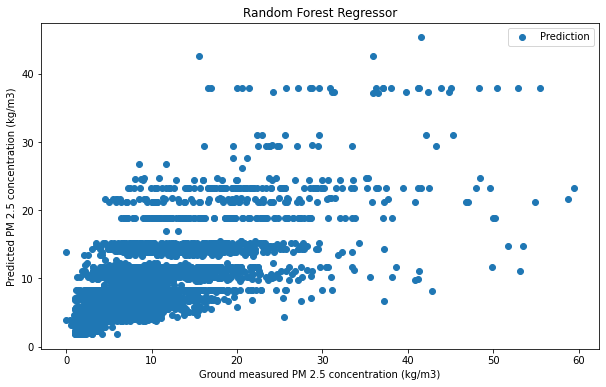

In [44]:
y_test_outlier = pd.DataFrame(y_test)
y_test_outlier = y_test_outlier.reset_index()
y_pred_dtree = pd.DataFrame(y_pred_dtree, columns = ['Dtree'])
dtree_outlier = pd.DataFrame.join(y_test_outlier, y_pred_dtree).reset_index().drop(['index', 'level_0'], axis =1)
dtree_outlier = dtree_outlier[dtree_outlier['PM25']< 80]

plt.figure(figsize =(10,6))
plt.scatter(dtree_outlier['PM25'], dtree_outlier['Dtree'], label = 'Prediction', cmap = 'inferno')
# plt.plot(np.unique(dtree_outlier['PM25']), np.poly1d(np.polyfit(dtree_outlier['PM25'], dtree_outlier['Dtree'], 1))(np.unique(dtree_outlier['PM25'])), color = 'red', label = 'Line of Best fit')
plt.xlabel('Ground measured PM 2.5 concentration (kg/m3)')
plt.ylabel('Predicted PM 2.5 concentration (kg/m3)')
plt.title('Random Forest Regressor')
# plt.savefig('RF.png')
plt.legend()

# Random Forest

In [ ]:
pipe_forest = Pipeline([
        ('scale', StandardScaler()), ('forest', RandomForestRegressor())])
pipe_forest.get_params().keys()

In [37]:
from sklearn.ensemble import RandomForestRegressor

pipe_rforest = Pipeline([
        ('scale', StandardScaler()), ('forest', RandomForestRegressor())])
# Hyperparameter Tuning
rforest_search = GridSearchCV(pipe_rforest,params,n_jobs=-1, cv=5,verbose=2)
# Training the model
rforest_search.fit(X_train.drop('Date', axis = 1), y_train)

dict_keys(['memory', 'steps', 'verbose', 'scale', 'forest', 'scale__copy', 'scale__with_mean', 'scale__with_std', 'forest__bootstrap', 'forest__ccp_alpha', 'forest__criterion', 'forest__max_depth', 'forest__max_features', 'forest__max_leaf_nodes', 'forest__max_samples', 'forest__min_impurity_decrease', 'forest__min_impurity_split', 'forest__min_samples_leaf', 'forest__min_samples_split', 'forest__min_weight_fraction_leaf', 'forest__n_estimators', 'forest__n_jobs', 'forest__oob_score', 'forest__random_state', 'forest__verbose', 'forest__warm_start'])

In [38]:
# Hypterparameter tuning was conducted using GridSearchCV
# The below parametrs were determined based on the results obtained from GridSearchCV
params = {'forest__n_estimators':[600]}
start_time = time.time()
forest_search = GridSearchCV(pipe_forest,params,n_jobs=-1, cv=5,verbose=2)
forest_search.fit(X_train.drop('Date', axis = 1),y_train.values.ravel())
print("--- %s seconds ---" % (time.time() - start_time))

Fitting 5 folds for each of 1 candidates, totalling 5 fits
--- 245.7280809879303 seconds ---


In [30]:
print('Score on train data: {}\n'.format(forest_search.score(X_train.drop('Date', axis = 1), y_train.values.ravel())))
print('Best parameters found:')
display(forest_search.best_params_)

Score on train data: 0.9659305912947309

Best parameters found:


{'forest__n_estimators': 600}

In [31]:
print('best cv score:')
display(forest_search.best_score_)

print('mean cv score:')
display(np.mean(forest_search.cv_results_["mean_test_score"]))

best cv score:


0.7399895732311348

mean cv score:


0.7399895732311348

In [32]:
forest_best_estim = forest_search.best_estimator_
print(forest_best_estim)

Pipeline(steps=[('scale', StandardScaler()),
                ('forest', RandomForestRegressor(n_estimators=600))])


In [33]:
forest_best_estim.fit(X_train.drop('Date', axis = 1), y_train)

forest_ytrain_pred = forest_best_estim.predict(X_train.drop('Date', axis = 1))

In [34]:
from sklearn.metrics import mean_absolute_error, mean_squared_error

forest_rmse = np.sqrt(mean_squared_error(forest_ytrain_pred,  y_train.values.ravel()))
forest_r2 = r2_score(forest_ytrain_pred,y_train.values.ravel())
forest_mae = mean_absolute_error(forest_ytrain_pred,  y_train.values.ravel())
forest_mse = mean_squared_error(forest_ytrain_pred,  y_train.values.ravel())
print("RMSE: %.2f" % forest_rmse)
print("MSE: %.2f" % forest_mse)
print("MAE: %.2f" % forest_mae)
print("R2: %.2f" % forest_r2)

RMSE: 1.22
MSE: 1.49
MAE: 0.76
R2: 0.96


In [35]:
from sklearn.metrics import mean_absolute_error, mean_squared_error

forest_rmse = np.sqrt(mean_squared_error(forest_ytrain_pred,  y_train.values.ravel()))
forest_r2 = r2_score(forest_ytrain_pred,y_train.values.ravel())
forest_mae = mean_absolute_error(forest_ytrain_pred,  y_train.values.ravel())
forest_mse = mean_squared_error(forest_ytrain_pred,  y_train.values.ravel())
print("RMSE: %.2f" % forest_rmse)
print("MSE: %.2f" % forest_mse)
print("MAE: %.2f" % forest_mae)
print("R2: %.2f" % forest_r2)

RMSE: 1.22
MSE: 1.49
MAE: 0.76
R2: 0.96


In [124]:
forest_best_estim.steps[1][1].feature_importances_

array([0.08366972, 0.01643641, 0.02466189, 0.01424851, 0.01543298,
       0.01050761, 0.05203687, 0.03903307, 0.11489218, 0.07478276,
       0.04614211, 0.05229555, 0.05029183, 0.0551749 , 0.17812341,
       0.03899095, 0.06320923, 0.03557833, 0.03449168])

In [128]:
feature_names_forest = forest_best_estim.named_steps['forest'].get_feature_names()

AttributeError: 'RandomForestRegressor' object has no attribute 'get_feature_names'

In [36]:
y_pred_rforest_coord = forest_best_estim.predict(X_test_coord)

In [37]:
y_pred_rforest = forest_best_estim.predict(X_test.drop('Date', axis = 1))

In [96]:
import plotly.express as px
y_test_outlier = pd.DataFrame(y_test)
y_test_outlier = y_test_outlier.reset_index()
y_pred_rforest_df = pd.DataFrame(y_pred_rforest, columns = ['Random Forest'])
rf_outlier = pd.DataFrame.join(y_test_outlier, y_pred_rforest_df).reset_index()
# rf_outlier = lgb_outlier.drop(['level_0', 'index'], axis = 1)
rf_outlier = rf_outlier[rf_outlier['PM25']< 80]
#
df = rf_outlier
fig = px.scatter(df, x='PM25', y='Random Forest', trendline="ols", trendline_color_override = 'red',
                labels={
                     "Random Forest": " Predicted PM 2.5 Concentration (μg/m3)",
                     "PM25": "Ground Measurement PM 2.5 (μg/m3)"})

fig.update_layout(title_text='Random Forest PM2.5 Concentration against Ground Measurements')
fig.show()

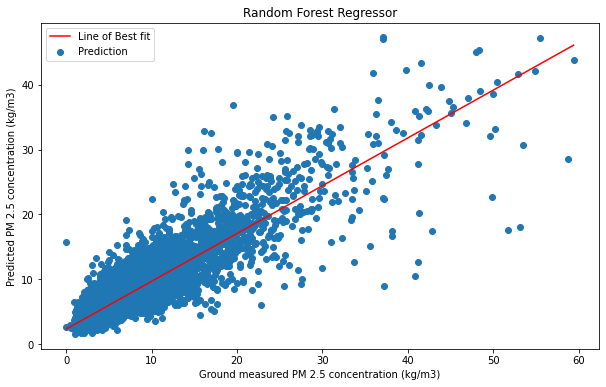

In [77]:
# y_test_outlier = pd.DataFrame(y_test)
# y_test_outlier = y_test_outlier.reset_index()
# y_pred_rforest = pd.DataFrame(y_pred_rforest, columns = ['Rforest'])
# rforest_outlier = pd.DataFrame.join(y_test_outlier, y_pred_rforest).reset_index().drop(['index', 'level_0'], axis =1)
# rforest_outlier = rforest_outlier[rforest_outlier['PM25']< 80]

plt.figure(figsize =(10,6))
plt.scatter(rforest_outlier['PM25'], rforest_outlier['Rforest'], label = 'Prediction', cmap = 'inferno')
plt.plot(np.unique(rforest_outlier['PM25']), np.poly1d(np.polyfit(rforest_outlier['PM25'], rforest_outlier['Rforest'], 1))(np.unique(rforest_outlier['PM25'])), color = 'red', label = 'Line of Best fit')
plt.xlabel('Ground measured PM 2.5 concentration (kg/m3)')
plt.ylabel('Predicted PM 2.5 concentration (kg/m3)')
plt.title('Random Forest Regressor')
# plt.savefig('RF.png')
plt.legend()

# Gradient Boosting Regressor

In [ ]:
from sklearn.ensemble import GradientBoostingRegressor

pipe_gboost = Pipeline([
        ('scale', StandardScaler()), ('gboost', GradientBoostingRegressor())])
params = {'gboost__learning_rate':[0.1],
         'gboost__max_depth':[10]}
# Hyperparameter Tuning
gboost_search = GridSearchCV(pipe_gboost,params,n_jobs=-1,cv=5,verbose=2)
# Training the model
gboost_search.fit(X_train.drop('Date', axis = 1), y_train)

In [35]:
pipe_gboost = Pipeline([
        ('scale', StandardScaler()), ('gboost', GradientBoostingRegressor())])
pipe_gboost.get_params().keys()

dict_keys(['memory', 'steps', 'verbose', 'scale', 'gboost', 'scale__copy', 'scale__with_mean', 'scale__with_std', 'gboost__alpha', 'gboost__ccp_alpha', 'gboost__criterion', 'gboost__init', 'gboost__learning_rate', 'gboost__loss', 'gboost__max_depth', 'gboost__max_features', 'gboost__max_leaf_nodes', 'gboost__min_impurity_decrease', 'gboost__min_impurity_split', 'gboost__min_samples_leaf', 'gboost__min_samples_split', 'gboost__min_weight_fraction_leaf', 'gboost__n_estimators', 'gboost__n_iter_no_change', 'gboost__random_state', 'gboost__subsample', 'gboost__tol', 'gboost__validation_fraction', 'gboost__verbose', 'gboost__warm_start'])

In [36]:
# Hypterparameter tuning was conducted using GridSearchCV
# The below parametrs were determined based on the results obtained from GridSearchCV
start_time = time.time()
params = {'gboost__learning_rate':[0.1],
         'gboost__max_depth':[10]}
gboost_search = GridSearchCV(pipe_gboost,params,n_jobs=-1,cv=5,verbose=2)
gboost_search.fit(X_train.drop('Date', axis = 1),y_train)
print("--- %s seconds ---" % (time.time() - start_time))

Fitting 5 folds for each of 1 candidates, totalling 5 fits
--- 47.11360430717468 seconds ---


In [53]:
print('Score on train data: {}\n'.format(gboost_search.score(X_train.drop('Date', axis = 1),y_train)))
print('Best parameters found:')
display(gboost_search.best_params_)

Score on train data: 0.9678074199877613

Best parameters found:


{'gboost__learning_rate': 0.1, 'gboost__max_depth': 10}

In [54]:
print('best cv score:')
display(np.mean(gboost_search.best_score_))

print('mean cv score:')
display(np.mean(gboost_search.cv_results_["mean_test_score"]))

best cv score:


0.7568174518936182

mean cv score:


0.7568174518936182

In [55]:
gboost_best_estim = gboost_search.best_estimator_
print(gboost_best_estim)

Pipeline(steps=[('scale', StandardScaler()),
                ('gboost', GradientBoostingRegressor(max_depth=10))])


In [57]:
gboost_best_estim.fit(X_train.drop('Date', axis = 1), y_train)

gboost_ytrain_pred = gboost_best_estim.predict(X_train.drop('Date', axis =1))


In [58]:
gboost_rmse = np.sqrt(mean_squared_error(gboost_ytrain_pred,  y_train.values.ravel()))
gboost_r2 = r2_score(gboost_ytrain_pred,y_train.values.ravel())
gboost_mae = mean_absolute_error(gboost_ytrain_pred,  y_train.values.ravel())
gboost_mse = mean_squared_error(gboost_ytrain_pred,  y_train.values.ravel())
print("RMSE: %.2f" % gboost_rmse)
print("MSE: %.2f" % gboost_mse)
print("MAE: %.2f" % gboost_mae)
print("R2: %.2f" % gboost_r2)

RMSE: 1.18
MSE: 1.40
MAE: 0.88
R2: 0.96


In [59]:
gboost_rmse = np.sqrt(mean_squared_error(gboost_ytrain_pred,  y_train.values.ravel()))
gboost_r2 = r2_score(gboost_ytrain_pred,y_train.values.ravel())
gboost_mae = mean_absolute_error(gboost_ytrain_pred,  y_train.values.ravel())
gboost_mse = mean_squared_error(gboost_ytrain_pred,  y_train.values.ravel())
print("RMSE: %.2f" % gboost_rmse)
print("MSE: %.2f" % gboost_mse)
print("MAE: %.2f" % gboost_mae)
print("R2: %.2f" % gboost_r2)

RMSE: 1.18
MSE: 1.40
MAE: 0.88
R2: 0.96


In [60]:
y_pred_gboost_coord = gboost_best_estim.predict(X_test_coord)

In [61]:
y_pred_gboost = gboost_best_estim.predict(X_test.drop('Date', axis = 1))

In [97]:
y_pred_gboost_df = pd.DataFrame(y_pred_gboost, columns = ['Gradient Boost'])
gboost_outlier = pd.DataFrame.join(y_test_outlier, y_pred_gboost_df).reset_index()
# gboost_outlier = lgb_outlier.drop(['level_0', 'index'], axis = 1)
gboost_outlier = gboost_outlier[gboost_outlier['PM25']< 80]
#
df = gboost_outlier
fig = px.scatter(df, x='PM25', y='Gradient Boost', trendline="ols", trendline_color_override = 'red',
                labels={
                     "Gradient Boost": " Predicted PM 2.5 Concentration (μg/m3)",
                     "PM25": "Ground Measurement PM 2.5 (μg/m3)"})

fig.update_layout(title_text='Gradient Boosting Regressor PM2.5 Concentration against Ground Measurements')
fig.show()

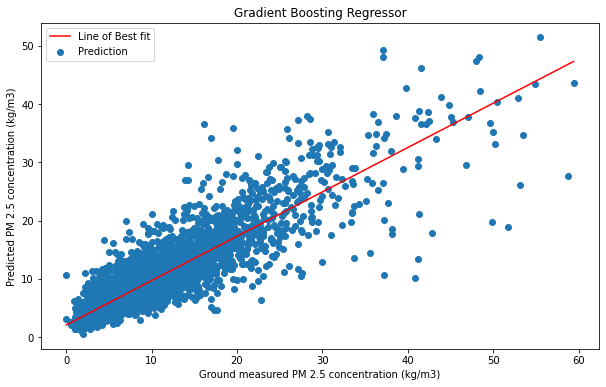

In [89]:
# y_test_outlier = pd.DataFrame(y_test)
# y_test_outlier = y_test_outlier.reset_index()
# y_pred_gboost = pd.DataFrame(y_pred_gboost, columns = ['Gboost'])
# gboost_outlier = pd.DataFrame.join(y_test_outlier, y_pred_gboost).reset_index()
# gboost_outlier = gboost_outlier.drop(['level_0', 'index'], axis = 1)
# gboost_outlier = gboost_outlier[gboost_outlier['PM25']< 80]

plt.figure(figsize =(10,6))
plt.scatter(gboost_outlier['PM25'], gboost_outlier['Gboost'], label = 'Prediction', cmap = 'inferno')
plt.plot(np.unique(gboost_outlier['PM25']), np.poly1d(np.polyfit(gboost_outlier['PM25'], gboost_outlier['Gboost'], 1))(np.unique(gboost_outlier['PM25'])), color = 'red', label = 'Line of Best fit')
plt.xlabel('Ground measured PM 2.5 concentration (kg/m3)')
plt.ylabel('Predicted PM 2.5 concentration (kg/m3)')
plt.title('Gradient Boosting Regressor')
# plt.savefig('GradientBoost.png')
plt.legend()

# XGBoost

In [ ]:
from xgboost import XGBRegressor

pipe_XGB = Pipeline([
        ('scale', StandardScaler()), ('xgb', XGBRegressor(objective='reg:squarederror'))])
params = {'xgb__learning_rate':[0.1],
         'xgb__max_depth': [11],
          'xgb__n_estimators':[1400],
         'xgb__reg_lambda': [1000]}
# Hyperparameter tuning 
XGB_search = GridSearchCV(pipe_xgb,params,n_jobs=-1,cv=5,verbose=2)
# Training the model
start_time = time.time()
XGB_search.fit(X_train.drop('Date', axis = 1), y_train)
print("--- %s seconds ---" % (time.time() - start_time))

In [32]:
pipe_xgb = Pipeline([
        ('scale', StandardScaler()), ('xgb', XGBRegressor(objective='reg:squarederror'))])
pipe_xgb.get_params().keys()

dict_keys(['memory', 'steps', 'verbose', 'scale', 'xgb', 'scale__copy', 'scale__with_mean', 'scale__with_std', 'xgb__objective', 'xgb__base_score', 'xgb__booster', 'xgb__colsample_bylevel', 'xgb__colsample_bynode', 'xgb__colsample_bytree', 'xgb__enable_categorical', 'xgb__gamma', 'xgb__gpu_id', 'xgb__importance_type', 'xgb__interaction_constraints', 'xgb__learning_rate', 'xgb__max_delta_step', 'xgb__max_depth', 'xgb__min_child_weight', 'xgb__missing', 'xgb__monotone_constraints', 'xgb__n_estimators', 'xgb__n_jobs', 'xgb__num_parallel_tree', 'xgb__predictor', 'xgb__random_state', 'xgb__reg_alpha', 'xgb__reg_lambda', 'xgb__scale_pos_weight', 'xgb__subsample', 'xgb__tree_method', 'xgb__validate_parameters', 'xgb__verbosity'])

In [33]:
# Hypterparameter tuning was conducted using GridSearchCV
# The below parametrs were determined based on the results obtained from GridSearchCV

start_time = time.time()
params = {'xgb__learning_rate':[0.1],
         'xgb__max_depth': [11],
          'xgb__n_estimators':[1400],
         'xgb__reg_lambda': [1000]}
xgb_search = GridSearchCV(pipe_xgb,params,n_jobs=-1,cv=5,verbose=2)
xgb_search.fit(X_train.drop('Date', axis = 1),y_train)
print("--- %s seconds ---" % (time.time() - start_time))

Fitting 5 folds for each of 1 candidates, totalling 5 fits
--- 120.53785610198975 seconds ---


In [65]:
print('Score on train data: {}\n'.format(xgb_search.score(X_train.drop('Date', axis = 1),y_train)))
print('Best parameters found:')
display(xgb_search.best_params_)

Score on train data: 0.9598170165125383

Best parameters found:


{'xgb__learning_rate': 0.1,
 'xgb__max_depth': 11,
 'xgb__n_estimators': 1400,
 'xgb__reg_lambda': 1000}

In [66]:
print('best cv score:')
display(xgb_search.best_score_)

print('mean cv score:')
display(np.mean(xgb_search.cv_results_["mean_test_score"]))

best cv score:


0.784328445788537

mean cv score:


0.784328445788537

In [67]:
xgb_best_estim = xgb_search.best_estimator_
print(xgb_best_estim)

Pipeline(steps=[('scale', StandardScaler()),
                ('xgb',
                 XGBRegressor(base_score=0.5, booster='gbtree',
                              colsample_bylevel=1, colsample_bynode=1,
                              colsample_bytree=1, enable_categorical=False,
                              gamma=0, gpu_id=-1, importance_type=None,
                              interaction_constraints='', learning_rate=0.1,
                              max_delta_step=0, max_depth=11,
                              min_child_weight=1, missing=nan,
                              monotone_constraints='()', n_estimators=1400,
                              n_jobs=16, num_parallel_tree=1, predictor='auto',
                              random_state=0, reg_alpha=0, reg_lambda=1000,
                              scale_pos_weight=1, subsample=1,
                              tree_method='exact', validate_parameters=1,
                              verbosity=None))])


In [68]:
xgb_best_estim.fit(X_train.drop('Date', axis = 1), y_train)

xgb_ytrain_pred = xgb_best_estim.predict(X_train.drop('Date', axis = 1))


In [69]:
xgb_rmse = np.sqrt(mean_squared_error(xgb_ytrain_pred,  y_train.values.ravel()))
xgb_r2 = r2_score(xgb_ytrain_pred,y_train.values.ravel())
xgb_mae = mean_absolute_error(xgb_ytrain_pred,  y_train.values.ravel())
xgb_mse = mean_squared_error(xgb_ytrain_pred,  y_train.values.ravel())
print("RMSE: %.2f" % xgb_rmse)
print("MSE: %.2f" % xgb_mse)
print("MAE: %.2f" % xgb_mae)
print("R2: %.2f" % xgb_r2)

RMSE: 1.32
MSE: 1.75
MAE: 0.72
R2: 0.95


In [70]:
xgb_rmse = np.sqrt(mean_squared_error(xgb_ytrain_pred,  y_train.values.ravel()))
xgb_r2 = r2_score(xgb_ytrain_pred,y_train.values.ravel())
xgb_mae = mean_absolute_error(xgb_ytrain_pred,  y_train.values.ravel())
xgb_mse = mean_squared_error(xgb_ytrain_pred,  y_train.values.ravel())
print("RMSE: %.2f" % xgb_rmse)
print("MSE: %.2f" % xgb_mse)
print("MAE: %.2f" % xgb_mae)
print("R2: %.2f" % xgb_r2)

RMSE: 1.32
MSE: 1.75
MAE: 0.72
R2: 0.95


In [71]:
y_pred_xgb_coord = xgb_best_estim.predict(X_test_coord)

In [72]:
y_pred_xgb = xgb_best_estim.predict(X_test.drop('Date', axis = 1))

In [79]:
y_pred_xgb_df = pd.DataFrame(y_pred_xgb, columns = ['XGBoost'])
xgb_outlier = pd.DataFrame.join(y_test_outlier, y_pred_xgb_df).reset_index()
# xgb_outlier = lgb_outlier.drop(['level_0', 'index'], axis = 1)
xgb_outlier = xgb_outlier[xgb_outlier['PM25']< 80]
#
df = xgb_outlier
fig = px.scatter(df, x='PM25', y='XGBoost', trendline="ols", trendline_color_override = 'red',
                labels={
                     "XGBoost": " Predicted PM 2.5 Concentration (μg/m3)",
                     "PM25": "Ground Measurement PM 2.5 (μg/m3)"})

fig.update_layout(title_text='XGBoost PM2.5 Concentration against Ground Measurements')
fig.show()

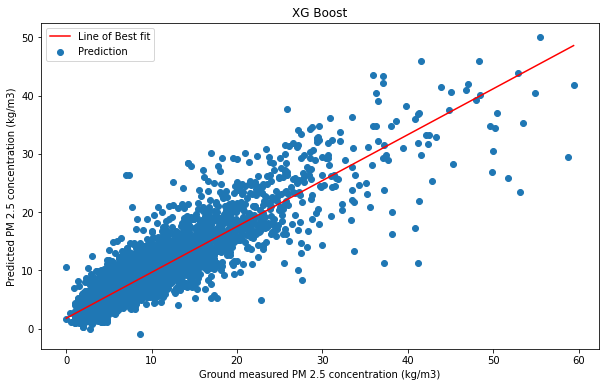

In [99]:
# y_test_outlier = pd.DataFrame(y_test)
# y_test_outlier = y_test_outlier.reset_index()
# y_pred_xgb = pd.DataFrame(y_pred_xgb, columns = ['XGB'])
# xgb_outlier = pd.DataFrame.join(y_test_outlier, y_pred_xgb).reset_index()
# xgb_outlier = xgb_outlier.drop(['level_0', 'index'], axis = 1)
# xgb_outlier = xgb_outlier[xgb_outlier['PM25']< 80]

plt.figure(figsize =(10,6))
plt.scatter(xgb_outlier['PM25'], xgb_outlier['XGB'], label = 'Prediction', cmap = 'inferno')
plt.plot(np.unique(xgb_outlier['PM25']), np.poly1d(np.polyfit(xgb_outlier['PM25'], xgb_outlier['XGB'], 1))(np.unique(xgb_outlier['PM25'])), color = 'red', label = 'Line of Best fit')
plt.xlabel('Ground measured PM 2.5 concentration (kg/m3)')
plt.ylabel('Predicted PM 2.5 concentration (kg/m3)')
plt.title('XG Boost')
# plt.savefig('XGBoost.png')
plt.legend()

# Light GBM

In [ ]:
from lightgbm import LGBMRegressor

pipe_LGBM = Pipeline([
        ('scale', StandardScaler()), ('LGBM', LGBMRegressor())])
params = {'LGBM__max_depth': [20],
          'LGBM__learning_rate':[0.1],
          'LGBM__num_leaves':[400],
          'LGBM__reg_lambda':[500],
          'LGBM__n_estimators': [800]
# Hyperparameter Tuning
LGBM_search = GridSearchCV(pipe_LGBM,params,n_jobs=-1,cv=5,verbose=2)
# Training the model
LGBM_search.fit(X_train.drop('Date', axis = 1), y_train)

In [31]:
pipe_LGBM = Pipeline([
        ('scale', StandardScaler()), ('LGBM', LGBMRegressor())])
pipe_LGBM.get_params().keys()

dict_keys(['memory', 'steps', 'verbose', 'scale', 'LGBM', 'scale__copy', 'scale__with_mean', 'scale__with_std', 'LGBM__boosting_type', 'LGBM__class_weight', 'LGBM__colsample_bytree', 'LGBM__importance_type', 'LGBM__learning_rate', 'LGBM__max_depth', 'LGBM__min_child_samples', 'LGBM__min_child_weight', 'LGBM__min_split_gain', 'LGBM__n_estimators', 'LGBM__n_jobs', 'LGBM__num_leaves', 'LGBM__objective', 'LGBM__random_state', 'LGBM__reg_alpha', 'LGBM__reg_lambda', 'LGBM__silent', 'LGBM__subsample', 'LGBM__subsample_for_bin', 'LGBM__subsample_freq'])

In [32]:
# Hypterparameter tuning was conducted using GridSearchCV
# Parametrs were determined based on the results obtained from GridSearchCV
import time
start_time = time.time()

params = {'LGBM__max_depth': [20],
          'LGBM__learning_rate':[0.1],
          'LGBM__num_leaves':[400],
          'LGBM__reg_lambda':[500],
          'LGBM__n_estimators': [800]
         }
LGBM_search = GridSearchCV(pipe_LGBM,params,n_jobs=-1,cv=5,verbose=2)
LGBM_search.fit(X_train.drop('Date', axis = 1),y_train.values.ravel())
print("--- %s seconds ---" % (time.time() - start_time))

Fitting 5 folds for each of 1 candidates, totalling 5 fits
--- 23.126869916915894 seconds ---


In [33]:
print('Score on train data: {}\n'.format(LGBM_search.score(X_train.drop('Date', axis = 1),y_train.values.ravel())))
print('Best parameters found:')
display(LGBM_search.best_params_)

Score on train data: 0.9660779691773815

Best parameters found:


{'LGBM__learning_rate': 0.1,
 'LGBM__max_depth': 20,
 'LGBM__n_estimators': 800,
 'LGBM__num_leaves': 400,
 'LGBM__reg_lambda': 500}

In [34]:
print('best cv score:')
display(LGBM_search.best_score_)

print('mean cv score:')
display(np.mean(LGBM_search.cv_results_["mean_test_score"]))

best cv score:


0.7909510147486039

mean cv score:


0.7909510147486039

In [35]:
LGBM_best_estim = LGBM_search.best_estimator_
print(LGBM_best_estim)

Pipeline(steps=[('scale', StandardScaler()),
                ('LGBM',
                 LGBMRegressor(max_depth=20, n_estimators=800, num_leaves=400,
                               reg_lambda=500))])


In [36]:
LGBM_best_estim.fit(X_train.drop('Date', axis = 1), y_train)

LGBM_ytrain_pred = LGBM_best_estim.predict(X_train.drop('Date', axis = 1))


In [37]:
from sklearn.metrics import mean_absolute_error, mean_squared_error

LGBM_rmse = np.sqrt(mean_squared_error(LGBM_ytrain_pred,  y_train.values.ravel()))
LGBM_r2 = r2_score(LGBM_ytrain_pred,y_train.values.ravel())
LGBM_mae = mean_absolute_error(LGBM_ytrain_pred,  y_train.values.ravel())
LGBM_mse = mean_squared_error(LGBM_ytrain_pred,  y_train.values.ravel())
print("RMSE: %.2f" % LGBM_rmse)
print("MSE: %.2f" % LGBM_mse)
print("MAE: %.2f" % LGBM_mae)
print("R2: %.2f" % LGBM_r2)

RMSE: 1.22
MSE: 1.48
MAE: 0.65
R2: 0.96


In [38]:
LGBM_rmse = np.sqrt(mean_squared_error(LGBM_ytrain_pred,  y_train.values.ravel()))
LGBM_r2 = r2_score(LGBM_ytrain_pred,y_train.values.ravel())
LGBM_mae = mean_absolute_error(LGBM_ytrain_pred,  y_train.values.ravel())
LGBM_mse = mean_squared_error(LGBM_ytrain_pred,  y_train.values.ravel())
print("RMSE: %.2f" % LGBM_rmse)
print("MSE: %.2f" % LGBM_mse)
print("MAE: %.2f" % LGBM_mae)
print("R2: %.2f" % LGBM_r2)

RMSE: 1.22
MSE: 1.48
MAE: 0.65
R2: 0.96


In [39]:
y_pred_lgb_coord = LGBM_best_estim.predict(X_test_coord.drop(['Lat', 'Long'], axis = 1))

In [40]:
y_pred_lgb_coord_df = pd.DataFrame(y_pred_lgb_coord, columns = ['PM2.5 Prediction'])

In [51]:
type(y_pred_lgb_coord_df)

pandas.core.frame.DataFrame

In [54]:
all_coord_predictions = pd.DataFrame.join(X_test_coord[['Lat','Long']], y_pred_lgb_coord_df)

In [55]:
all_coord_predictions

,Lat,Long,PM2.5 Prediction
0,55.667,-2.08950,3.759217
1,55.415,-2.16010,4.577270
2,55.477,-1.71490,3.615421
3,55.143,-2.34620,4.794055
4,54.941,-2.26710,4.083904
...,...,...,...
459,53.423,-2.39429,3.665310
460,53.519,-2.35710,4.034575
461,53.599,-2.43002,3.794987
462,53.485,-2.54110,3.364793


In [43]:
y_pred_lgb = LGBM_best_estim.predict(X_test.drop('Date',axis = 1))

In [68]:
# !pip install shapely
!pip install geopandas

  Running setup.py clean for fiona
Failed to build fiona
    Running setup.py install for fiona: started
    Running setup.py install for fiona: finished with status 'error'


    ERROR: Command errored out with exit status 1:
     command: 'C:\Users\Zenudeen\anaconda3\python.exe' -c 'import io, os, sys, setuptools, tokenize; sys.argv[0] = '"'"'C:\\Users\\Zenudeen\\AppData\\Local\\Temp\\pip-install-t5fca692\\fiona_b726ca2e601c4affb1a8cb9f6be9b274\\setup.py'"'"'; __file__='"'"'C:\\Users\\Zenudeen\\AppData\\Local\\Temp\\pip-install-t5fca692\\fiona_b726ca2e601c4affb1a8cb9f6be9b274\\setup.py'"'"';f = getattr(tokenize, '"'"'open'"'"', open)(__file__) if os.path.exists(__file__) else io.StringIO('"'"'from setuptools import setup; setup()'"'"');code = f.read().replace('"'"'\r\n'"'"', '"'"'\n'"'"');f.close();exec(compile(code, __file__, '"'"'exec'"'"'))' egg_info --egg-base 'C:\Users\Zenudeen\AppData\Local\Temp\pip-pip-egg-info-cyvqc3f6'
         cwd: C:\Users\Zenudeen\AppData\Local\Temp\pip-install-t5fca692\fiona_b726ca2e601c4affb1a8cb9f6be9b274\
    Complete output (1 lines):
    A GDAL API version must be specified. Provide a path to gdal-config using a GDAL_CONF

In [77]:
import os
from urllib.request import urlretrieve
from urllib.request import urlopen
from bs4 import BeautifulSoup
import pandas as pd
import numpy as np
import re
import json
import numpy as np
import timeit 
from datetime import datetime
from plotly.offline import iplot
from scipy.interpolate import griddata
from numpy import linspace
import plotly.express as px
from shapely.geometry import Polygon, MultiPolygon
import matplotlib.pyplot as plt


In [103]:
trace0=go.Scattermapbox(
            lat=all_coord_predictions['Lat'],
            lon= all_coord_predictions['Long'],
          
            mode='markers',
            marker=dict(
                opacity=0.5, 
                size=10, 
                color= all_coord_predictions['PM2.5 Prediction'],
                cmax=20000,
                showscale=True),
            
           
            )



data=[trace0]

layout = go.Layout(
    title="Spatial PM2.5 concentration (μg/m3) ",  
    title_x=0.4,
   
    
    
    height = 800,
    # top, bottom, left and right margins
    margin = dict(t = 80, b = 0, l = 0, r = 0),
    font = dict(color = 'dark grey', size = 14),
 
    mapbox = dict(
       

        center = dict(
            lat = 55.3781,
            lon = 3.4360
        ),
        # default level of zoom
        zoom = 5,
        # default map style
        style = "open-street-map"
    )

)

figure=go.Figure(
    data=data,
    layout=layout,
  
    )



iplot(figure)

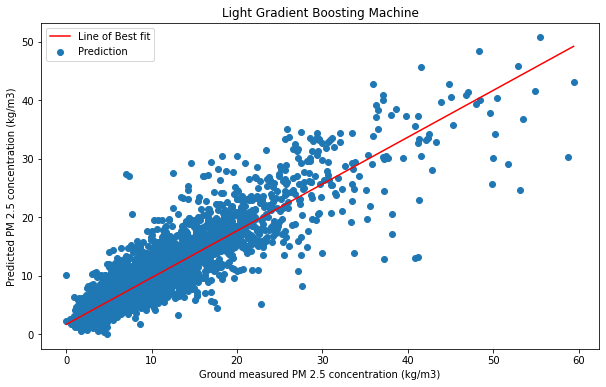

In [46]:
y_test_outlier = pd.DataFrame(y_test)
y_test_outlier = y_test_outlier.reset_index()
y_pred_lgb = pd.DataFrame(y_pred_lgb, columns = ['LGBM'])
lgb_outlier = pd.DataFrame.join(y_test_outlier, y_pred_lgb).reset_index()
lgb_outlier = lgb_outlier.drop(['level_0', 'index'], axis = 1)
lgb_outlier = lgb_outlier[lgb_outlier['PM25']< 80]

plt.figure(figsize =(10,6))
plt.scatter(lgb_outlier['PM25'], lgb_outlier['LGBM'], label = 'Prediction', cmap = 'inferno')
plt.plot(np.unique(lgb_outlier['PM25']), np.poly1d(np.polyfit(lgb_outlier['PM25'], lgb_outlier['LGBM'], 1))(np.unique(lgb_outlier['PM25'])), color = 'red', label = 'Line of Best fit')
plt.xlabel('Ground measured PM 2.5 concentration (kg/m3)')
plt.ylabel('Predicted PM 2.5 concentration (kg/m3)')
plt.title('Light Gradient Boosting Machine')
# plt.savefig('LGBM.png')
plt.legend()

In [52]:
import plotly.express as px
y_test_outlier = pd.DataFrame(y_test)
y_test_outlier = y_test_outlier.reset_index()
y_pred_LGBM = pd.DataFrame(y_pred_lgb, columns = ['LGBM'])
LGBM_outlier = pd.DataFrame.join(y_test_outlier, y_pred_LGBM).reset_index().drop(['index', 'level_0'], axis =1)
LGBM_outlier = LGBM_outlier[LGBM_outlier['PM25']< 80]

# plt.figure(figsize =(10,6))
# plt.scatter(lgb_outlier['PM25'], lgb_outlier['LGBM'], label = 'Prediction', cmap = 'inferno')
# plt.plot(np.unique(lgb_outlier['PM25']), np.poly1d(np.polyfit(lgb_outlier['PM25'], lgb_outlier['LGBM'], 1))(np.unique(lgb_outlier['PM25'])), color = 'red', label = 'Line of Best fit')
# plt.xlabel('Ground measured PM 2.5 concentration (kg/m3)')
# plt.ylabel('Predicted PM 2.5 concentration (kg/m3)')
# plt.title('Light Gradient Boosting Machine')
# # plt.savefig('LGBM.png')
# plt.legend()


df = LGBM_outlier
fig = px.scatter(df, x='PM25', y='LGBM', trendline="ols", trendline_color_override = 'red',
                labels={
                     "LGBM": " Predicted PM 2.5 Concentration (μg/m3)",
                     "PM25": "Ground Measured PM 2.5 (μg/m3)"})

fig.update_layout(title_text='LightGBM PM 2.5 Concentration against Ground Measurements')
fig.show()

In [100]:
y_pred_df = pd.DataFrame(y_pred_lgb, columns = ['Predictions'])
y_pred_df.to_csv('y_pred_df_lgbm.csv')

In [120]:
predictions_by_date = pd.read_csv('PREDICTIONS_BY_DATE.csv')

In [124]:
predictions_by_date.iloc[0]

Date           27/09/2018
Y_test           7.176471
Predictions      3.492746
Name: 0, dtype: object

In [129]:
import plotly.express as px

df = predictions_by_date[:3267]
# fig = px.line(df, x='Date', y="Y_test", color_discrete_sequence=['blue'])
# fig = px.line(df, x = 'Date', y = 'Predictions',color_discrete_sequence=["red"])
fig = px.line(df, x='Date', y=df.columns[1:])
fig.update_xaxes(
    ticktext=["10/2018", "11/2018", "12/2018", "01/2019","02/2019", "03/2019", "04/2019", "05/2019",
             "06/2019", "07/2019", "08/2019", "09/2019", "10/2019", "11/2019", "12/2019", "01/2020", "02/2020", "03/2020"],
tickvals=["10/10/2018", "16/11/2018", "14/12/2018", "15/01/2019", "15/02/2019", "15/03/2019", "15/04/2019",
             "15/05/2019", "15/06/2019", "15/07/2019", "15/08/2019", "15/09/2019", "15/10/2019", "15/11/2019",
             "15/12/2019", "15/01/2020", "15/02/2020", "15/03/2020"])
fig.update_layout(title="LGBM Temporal variation of PM2.5",yaxis_title="PM2.5 Concentration (μg/m3)",)
fig.show()

In [138]:
gboost_temporal = pd.read_csv('Temporal_variation_gboost_pm25.csv')
df = gboost_df[:3267]
# fig = px.line(df, x='Date', y="Y_test", color_discrete_sequence=['blue'])
# fig = px.line(df, x = 'Date', y = 'Predictions',color_discrete_sequence=["red"])
fig = px.line(df, x='Date', y=df.columns[1:])
fig.update_xaxes(
    ticktext=["10/2018", "11/2018", "12/2018", "01/2019","02/2019", "03/2019", "04/2019", "05/2019",
             "06/2019", "07/2019", "08/2019", "09/2019", "10/2019", "11/2019", "12/2019", "01/2020", "02/2020", "03/2020"],
tickvals=["10/10/2018", "16/11/2018", "14/12/2018", "15/01/2019", "15/02/2019", "15/03/2019", "15/04/2019",
             "15/05/2019", "15/06/2019", "15/07/2019", "15/08/2019", "15/09/2019", "15/10/2019", "15/11/2019",
             "15/12/2019", "15/01/2020", "15/02/2020", "15/03/2020"])
fig.update_layout(title="LGBM Temporal variation of PM2.5",yaxis_title="PM2.5 Concentration (μg/m3)",)
fig.show()

# Correlations

In [47]:
# Predictions for each model

# predict_pm25_dtree = pd.DataFrame(y_pred_dtree_coord, columns = ['Predict DTree'])
# predict_pm25_rforest = pd.DataFrame(y_pred_rforest_coord, columns = ['Predict Rforest'])
# predict_pm25_gboost = pd.DataFrame(y_pred_gboost_coord, columns = ['Predict Gboost'])
# predict_pm25_xgb = pd.DataFrame(y_pred_xgb_coord, columns = ['Predict XGB'])
predict_pm25_lgb = pd.DataFrame(y_pred_lgb_coord, columns = ['Predict LGBM'])

In [48]:
respiratory = [749,721,797,935,926,610,845,708,554,680,655,652,736,553,585,
618,637,711,823,639,806,808,1087,689,651,681,628,615,608,676,619,573,835,733,
733,896,681,941,863,600,567,739,850,852,859,]
respiratory_disease = pd.DataFrame(respiratory, columns = ['Respiratory'])

asthma = [75,34,49,72,69,45,42,49,43,45,42,53,48,34,38,38,46,59,63,32,58,45,85,
39,36,37,40,41,36,33,32,37,52,66,45,51,42,62,49,35,31,46,49,61,47]
asthma_df = pd.DataFrame(asthma, columns = ['Asthma'])

copd = [130,117,214,229,205,90,194,115,90,111,110,106,157,79,94,115,93,165,110,
105,121,103,196,116,116,1136,103,122,101,100,81,88,192,142,144,191,140,192,163,112,88,136,159,177,161]
copd_df = pd.DataFrame(copd, columns = ['COPD'])

In [52]:
coordinates = pd.read_csv('Coordinates_updated_long.csv')
# correlation = pd.DataFrame.join(predict_pm25_rforest, predict_pm25_dtree)
# correlation = correlation.join(predict_pm25_gboost)
# correlation = correlation.join(predict_pm25_xgb)
correlation = pd.DataFrame.join(predict_pm25_lgb, coordinates['location'])
# correlation = correlation.join(predict_pm25_lgb)
# correlation = correlation.join(coordinates['location'])


In [53]:
correlation_groupby = correlation.groupby('location',sort = False, as_index=False).mean(lambda x: set(x))

In [54]:
correlation_groupby = correlation_groupby.join(respiratory_disease)
correlation_groupby = correlation_groupby.join(asthma_df)
correlation_groupby = correlation_groupby.join(copd_df)

Dtree, Respiratory: 0.34094874711357226
Rforest, Respiratory: 0.18830913918697967
GBoost, Respiratory: 0.25796301657819726
XGB, Respiratory: 0.12846646459269936
LGBM, Respiratory: 0.23811049777966087

spearmanr Dtree, Respiratory: 0.37381235256789286
spearmanr Rforest, Respiratory: 0.23321694496885323
spearmanr GBoost, Respiratory: 0.26536662551823187
spearmanr XGB, Respiratory: 0.15936491239538306
spearmanr LGBM, Respiratory: 0.1948086175912144


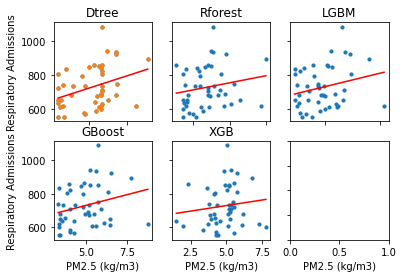

<Figure size 1080x504 with 0 Axes>

In [103]:
# Respiratory

fig, axs = plt.subplots(2, 3)
plt.figure(figsize = (15,7))

axs[0,0].scatter(correlation_groupby['Predict DTree'], correlation_groupby['Respiratory'], s = 10)
axs[0, 0].set_title('Dtree')
axs[0, 0].scatter(correlation_groupby['Predict DTree'], correlation_groupby['Respiratory'], s = 10, label = 'Correlation')
axs[0, 0].plot(np.unique(correlation_groupby['Predict DTree']), np.poly1d(np.polyfit(correlation_groupby['Predict DTree'], correlation_groupby['Respiratory'], 1))(np.unique(correlation_groupby['Predict DTree'])), 
color = 'red', label ='Line of best fit')

axs[0, 1].scatter(correlation_groupby['Predict Rforest'], correlation_groupby['Respiratory'], s = 10 )
axs[0, 1].set_title('Rforest')
axs[0, 1].plot(np.unique(correlation_groupby['Predict Rforest']), np.poly1d(np.polyfit(correlation_groupby['Predict Rforest'], correlation_groupby['Respiratory'], 1))(np.unique(correlation_groupby['Predict Rforest'])), color = 'red')


axs[1, 0].scatter(correlation_groupby['Predict Gboost'], correlation_groupby['Respiratory'], s = 10 )
axs[1, 0].set_title('GBoost')
axs[1, 0].plot(np.unique(correlation_groupby['Predict Gboost']), np.poly1d(np.polyfit(correlation_groupby['Predict Gboost'], correlation_groupby['Respiratory'], 1))(np.unique(correlation_groupby['Predict Gboost'])), color = 'red')


axs[1, 1].scatter(correlation_groupby['Predict XGB'], correlation_groupby['Respiratory'], s = 10 )
axs[1, 1].set_title('XGB')
axs[1, 1].plot(np.unique(correlation_groupby['Predict XGB']), np.poly1d(np.polyfit(correlation_groupby['Predict XGB'], correlation_groupby['Respiratory'], 1))(np.unique(correlation_groupby['Predict XGB'])), color = 'red')



axs[0, 2].scatter(correlation_groupby['Predict LGBM'], correlation_groupby['Respiratory'], s = 10)
axs[0, 2].set_title('LGBM')
axs[0, 2].plot(np.unique(correlation_groupby['Predict LGBM']), np.poly1d(np.polyfit(correlation_groupby['Predict LGBM'], correlation_groupby['Respiratory'], 1))(np.unique(correlation_groupby['Predict LGBM'])), color = 'red')

for ax in axs.flat:
    ax.set(xlabel='PM2.5 (kg/m3)', ylabel='Respiratory Admissions')
    ax.label_outer()

    # Pearson
print('Dtree, Respiratory:', pearsonr(correlation_groupby['Predict DTree'],
         correlation_groupby['Respiratory'])[0])
print('Rforest, Respiratory:', pearsonr(correlation_groupby['Predict Rforest'],
         correlation_groupby['Respiratory'])[0])
print('GBoost, Respiratory:', pearsonr(correlation_groupby['Predict Gboost'],
         correlation_groupby['Respiratory'])[0])
print('XGB, Respiratory:', pearsonr(correlation_groupby['Predict XGB'],
         correlation_groupby['Respiratory'])[0])
print('LGBM, Respiratory:', pearsonr(correlation_groupby['Predict LGBM'],
         correlation_groupby['Respiratory'])[0])
print()

# Spearman
print('spearmanr Dtree, Respiratory:', spearmanr(correlation_groupby['Predict DTree'],
         correlation_groupby['Respiratory'])[0])
print('spearmanr Rforest, Respiratory:', spearmanr(correlation_groupby['Predict Rforest'],
         correlation_groupby['Respiratory'])[0])
print('spearmanr GBoost, Respiratory:', spearmanr(correlation_groupby['Predict Gboost'],
         correlation_groupby['Respiratory'])[0])
print('spearmanr XGB, Respiratory:', spearmanr(correlation_groupby['Predict XGB'],
         correlation_groupby['Respiratory'])[0])
print('spearmanr LGBM, Respiratory:', spearmanr(correlation_groupby['Predict LGBM'],
         correlation_groupby['Respiratory'])[0])

# Respiratory

Pearson Dtree, Asthma: 0.23044852286834408
Pearson Rforest, Asthma: 0.17061247216510583
Pearson GBoost, Asthma: 0.17745516619763452
Pearson XGB, Asthma: 0.10430950905040579
Pearson LGBM, Asthma: 0.13508040129638815

spearmanr Dtree, Asthma: 0.28585616514664486
spearmanr Rforest, Asthma: 0.17507426961891617
spearmanr GBoost, Asthma: 0.1852292366702582
spearmanr XGB, Asthma: 0.08473462766866564
spearmanr LGBM, Asthma: 0.08473462766866564


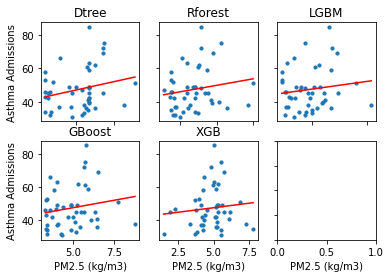

<Figure size 1080x504 with 0 Axes>

In [107]:
# Asthma

fig, axs = plt.subplots(2, 3)
plt.figure(figsize = (15,7))


asthma_outlier = correlation_groupby[['Predict DTree', 'Predict Rforest', 'Predict Gboost', 'Predict XGB', 'Predict LGBM',
                                   'Asthma']]


axs[0, 0].scatter(asthma_outlier['Predict DTree'], asthma_outlier['Asthma'], s = 10)
axs[0, 0].set_title('Dtree')
axs[0, 0].plot(np.unique(asthma_outlier['Predict DTree']), np.poly1d(np.polyfit(asthma_outlier['Predict DTree'], asthma_outlier['Asthma'], 1))(np.unique(asthma_outlier['Predict DTree'])), color = 'red')


axs[0, 1].scatter(asthma_outlier['Predict Rforest'], asthma_outlier['Asthma'], s = 10)
axs[0, 1].set_title('Rforest')
axs[0, 1].plot(np.unique(asthma_outlier['Predict Rforest']), np.poly1d(np.polyfit(asthma_outlier['Predict Rforest'], asthma_outlier['Asthma'], 1))(np.unique(asthma_outlier['Predict Rforest'])), color = 'red')


axs[1, 0].scatter(asthma_outlier['Predict Gboost'], asthma_outlier['Asthma'], s = 10 )
axs[1, 0].set_title('GBoost')
axs[1, 0].plot(np.unique(asthma_outlier['Predict Gboost']), np.poly1d(np.polyfit(asthma_outlier['Predict Gboost'], asthma_outlier['Asthma'], 1))(np.unique(asthma_outlier['Predict Gboost'])), color = 'red')


axs[1, 1].scatter(asthma_outlier['Predict XGB'], asthma_outlier['Asthma'], s = 10 )
axs[1, 1].set_title('XGB')
axs[1, 1].plot(np.unique(asthma_outlier['Predict XGB']), np.poly1d(np.polyfit(asthma_outlier['Predict XGB'], asthma_outlier['Asthma'], 1))(np.unique(asthma_outlier['Predict XGB'])), color = 'red')


axs[0, 2].scatter(asthma_outlier['Predict LGBM'], asthma_outlier['Asthma'], s = 10)
axs[0, 2].set_title('LGBM')
axs[0, 2].plot(np.unique(asthma_outlier['Predict LGBM']), np.poly1d(np.polyfit(asthma_outlier['Predict LGBM'], asthma_outlier['Asthma'], 1))(np.unique(asthma_outlier['Predict LGBM'])), color = 'red')

for ax in axs.flat:
    ax.set(xlabel='PM2.5 (kg/m3)', ylabel='Asthma Admissions')
    ax.label_outer()    

from scipy.stats import pearsonr
from scipy.stats import spearmanr

# Pearson 
print('Pearson Dtree, Asthma:', pearsonr(correlation_groupby['Predict DTree'],
         correlation_groupby['Asthma'])[0])
print('Pearson Rforest, Asthma:', pearsonr(correlation_groupby['Predict Rforest'],
         correlation_groupby['Asthma'])[0])
print('Pearson GBoost, Asthma:', pearsonr(correlation_groupby['Predict Gboost'],
         correlation_groupby['Asthma'])[0])
print('Pearson XGB, Asthma:', pearsonr(correlation_groupby['Predict XGB'],
         correlation_groupby['Asthma'])[0])
print('Pearson LGBM, Asthma:', pearsonr(correlation_groupby['Predict LGBM'],
         correlation_groupby['Asthma'])[0])
print()

# Spearman
print('spearmanr Dtree, Asthma:', spearmanr(correlation_groupby['Predict DTree'],
         correlation_groupby['Asthma'])[0])
print('spearmanr Rforest, Asthma:', spearmanr(correlation_groupby['Predict Rforest'],
         correlation_groupby['Asthma'])[0])
print('spearmanr GBoost, Asthma:', spearmanr(correlation_groupby['Predict Gboost'],
         correlation_groupby['Asthma'])[0])
print('spearmanr XGB, Asthma:', spearmanr(correlation_groupby['Predict XGB'],
         correlation_groupby['Asthma'])[0])
print('spearmanr LGBM, Asthma:', spearmanr(correlation_groupby['Predict LGBM'],
         correlation_groupby['Asthma'])[0])  

# Asthma

Dtree, COPD: 0.3812086749961858
Rforest, COPD: 0.21812086202730405
GBoost, COPD: 0.2865729436175248
XGB, COPD: 0.16714011540892895
LGBM, COPD: 0.2771199037852413

spearmanr Dtree, COPD: 0.3645287418108006
spearmanr Rforest, COPD: 0.2417553518643107
spearmanr GBoost, COPD: 0.25743749243223274
spearmanr XGB, COPD: 0.18950351375354524
spearmanr LGBM, COPD: 0.23048793154029948


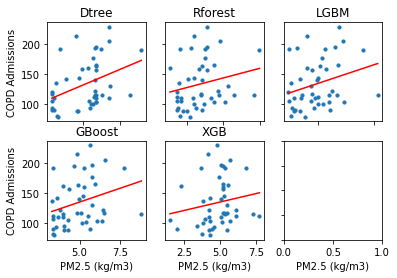

<Figure size 1440x864 with 0 Axes>

In [108]:
# COPD

fig, axs = plt.subplots(2, 3)
plt.figure(figsize = (20,12))

copd_outlier = correlation_groupby[['Predict DTree', 'Predict Rforest', 'Predict Gboost', 'Predict XGB', 'Predict LGBM',
                                   'COPD']]

copd_outlier = copd_outlier[copd_outlier['COPD'] <1000]
axs[0, 0].scatter(copd_outlier['Predict DTree'], copd_outlier['COPD'], s = 10)
axs[0, 0].set_title('Dtree')
axs[0, 0].plot(np.unique(copd_outlier['Predict DTree']), np.poly1d(np.polyfit(copd_outlier['Predict DTree'], copd_outlier['COPD'], 1))(np.unique(copd_outlier['Predict DTree'])), color = 'red')


axs[0, 1].scatter(copd_outlier['Predict Rforest'], copd_outlier['COPD'],s = 10 )
axs[0, 1].set_title('Rforest')
axs[0, 1].plot(np.unique(copd_outlier['Predict Rforest']), np.poly1d(np.polyfit(copd_outlier['Predict Rforest'], copd_outlier['COPD'], 1))(np.unique(copd_outlier['Predict Rforest'])), color = 'red')


axs[1, 0].scatter(copd_outlier['Predict Gboost'], copd_outlier['COPD'],s = 10 )
axs[1, 0].set_title('GBoost')
axs[1, 0].plot(np.unique(copd_outlier['Predict Gboost']), np.poly1d(np.polyfit(copd_outlier['Predict Gboost'], copd_outlier['COPD'], 1))(np.unique(copd_outlier['Predict Gboost'])), color = 'red')


axs[1, 1].scatter(copd_outlier['Predict XGB'], copd_outlier['COPD'],s = 10 )
axs[1, 1].set_title('XGB')
axs[1, 1].plot(np.unique(copd_outlier['Predict XGB']), np.poly1d(np.polyfit(copd_outlier['Predict XGB'], copd_outlier['COPD'], 1))(np.unique(copd_outlier['Predict XGB'])), color = 'red')


axs[0, 2].scatter(copd_outlier['Predict LGBM'], copd_outlier['COPD'],s = 10)
axs[0, 2].set_title('LGBM')
axs[0, 2].plot(np.unique(copd_outlier['Predict LGBM']), np.poly1d(np.polyfit(copd_outlier['Predict LGBM'], copd_outlier['COPD'], 1))(np.unique(copd_outlier['Predict LGBM'])), color = 'red')

for ax in axs.flat:
    ax.set(xlabel='PM2.5 (kg/m3)', ylabel='COPD Admissions')
    ax.label_outer()
    
# Pearson

print('Dtree, COPD:', pearsonr(copd_outlier['Predict DTree'],
         copd_outlier['COPD'])[0])
print('Rforest, COPD:', pearsonr(copd_outlier['Predict Rforest'],
         copd_outlier['COPD'])[0])
print('GBoost, COPD:', pearsonr(copd_outlier['Predict Gboost'],
         copd_outlier['COPD'])[0])
print('XGB, COPD:', pearsonr(copd_outlier['Predict XGB'],
         copd_outlier['COPD'])[0])
print('LGBM, COPD:', pearsonr(copd_outlier['Predict LGBM'],
         copd_outlier['COPD'])[0])

print()

# Spearman
print('spearmanr Dtree, COPD:', spearmanr(correlation_groupby['Predict DTree'],
         correlation_groupby['COPD'])[0])
print('spearmanr Rforest, COPD:', spearmanr(correlation_groupby['Predict Rforest'],
         correlation_groupby['COPD'])[0])
print('spearmanr GBoost, COPD:', spearmanr(correlation_groupby['Predict Gboost'],
         correlation_groupby['COPD'])[0])
print('spearmanr XGB, COPD:', spearmanr(correlation_groupby['Predict XGB'],
         correlation_groupby['COPD'])[0])
print('spearmanr LGBM, COPD:', spearmanr(correlation_groupby['Predict LGBM'],
         correlation_groupby['COPD'])[0])

# COPD

In [55]:
asthma_19 = [81,73,90,98,83,48,47,80,62,86,55,56,59,54,62,60,63,
60,80,62,100,95,35,53,69,46,74,55,37,75,36,48,56,52,
52,71,46,91,97,70,51,66,70,105,119]

asthma_all_ages = []



for (item1, item2) in zip(asthma, asthma_19):
    asthma_all_ages.append(item1+item2)

print(asthma_all_ages) 

[156, 107, 139, 170, 152, 93, 89, 129, 105, 131, 97, 109, 107, 88, 100, 98, 109, 119, 143, 94, 158, 140, 120, 92, 105, 83, 114, 96, 73, 108, 68, 85, 108, 118, 97, 122, 88, 153, 146, 105, 82, 112, 119, 166, 166]


In [56]:
asthma_all_ages_df = pd.DataFrame(asthma_all_ages, columns = ['Asthma All Ages'])

# correlation_groupby =correlation_groupby.join(asthma_all_ages_df)
# correlation_groupby = correlation_groupby.drop('Unnamed: 0', axis = 1)

Pearson Dtree, Asthma All Ages: 0.2921423870063146
Pearson Rforest, Asthma All Ages: 0.11734579108881671
Pearson GBoost, Asthma All Ages: 0.18409588725102424
Pearson XGB, Asthma All Ages: 0.0709145101996159
Pearson LGBM, Asthma All Ages: 0.13869741684881298

Spearmanr Dtree, Asthma All Ages: 0.35214235656934834
Spearmanr Rforest, Asthma All Ages: 0.18400877820223058
Spearmanr GBoost, Asthma All Ages: 0.2397552799728571
Spearmanr XGB, Asthma All Ages: 0.12969748447176926
Spearmanr LGBM, Asthma: 0.18060960126499723


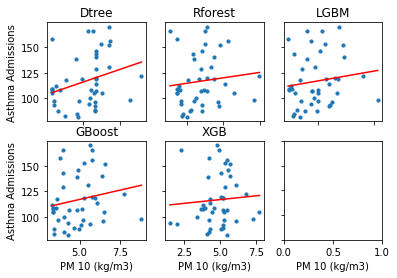

<Figure size 1440x864 with 0 Axes>

In [114]:
# Asthma

fig, axs = plt.subplots(2, 3)
plt.figure(figsize = (20,12))

asthma_outlier = correlation_groupby[['Predict DTree', 'Predict Rforest', 'Predict Gboost', 'Predict XGB', 'Predict LGBM',
                                   'Asthma All Ages']]

asthma_outlier = asthma_outlier[asthma_outlier['Asthma All Ages']>75]

asthma_outlier = asthma_outlier[(asthma_outlier['Predict DTree'] <15) & (asthma_outlier['Predict Rforest'] <15)
                            & (asthma_outlier['Predict Gboost'] <15)  & (asthma_outlier['Predict XGB'] <15) &
                           (asthma_outlier['Predict LGBM'] <15)]

axs[0, 0].scatter(asthma_outlier['Predict DTree'], asthma_outlier['Asthma All Ages'], s = 10)
axs[0, 0].set_title('Dtree')
axs[0, 0].plot(np.unique(asthma_outlier['Predict DTree']), np.poly1d(np.polyfit(asthma_outlier['Predict DTree'], asthma_outlier['Asthma All Ages'], 1))(np.unique(asthma_outlier['Predict DTree'])), color = 'red')

axs[0, 1].scatter(asthma_outlier['Predict Rforest'], asthma_outlier['Asthma All Ages'], s = 10 )
axs[0, 1].set_title('Rforest')
axs[0, 1].plot(np.unique(asthma_outlier['Predict Rforest']), np.poly1d(np.polyfit(asthma_outlier['Predict Rforest'], asthma_outlier['Asthma All Ages'], 1))(np.unique(asthma_outlier['Predict Rforest'])), color = 'red')

axs[1, 0].scatter(asthma_outlier['Predict Gboost'], asthma_outlier['Asthma All Ages'], s = 10 )
axs[1, 0].set_title('GBoost')
axs[1, 0].plot(np.unique(asthma_outlier['Predict Gboost']), np.poly1d(np.polyfit(asthma_outlier['Predict Gboost'], asthma_outlier['Asthma All Ages'], 1))(np.unique(asthma_outlier['Predict Gboost'])), color = 'red')

axs[1, 1].scatter(asthma_outlier['Predict XGB'], asthma_outlier['Asthma All Ages'], s = 10 )
axs[1, 1].set_title('XGB')
axs[1, 1].plot(np.unique(asthma_outlier['Predict XGB']), np.poly1d(np.polyfit(asthma_outlier['Predict XGB'], asthma_outlier['Asthma All Ages'], 1))(np.unique(asthma_outlier['Predict XGB'])), color = 'red')

axs[0, 2].scatter(asthma_outlier['Predict LGBM'], asthma_outlier['Asthma All Ages'], s = 10)
axs[0, 2].set_title('LGBM')
axs[0, 2].plot(np.unique(asthma_outlier['Predict LGBM']), np.poly1d(np.polyfit(asthma_outlier['Predict LGBM'], asthma_outlier['Asthma All Ages'], 1))(np.unique(asthma_outlier['Predict LGBM'])), color = 'red')

for ax in axs.flat:
    ax.set(xlabel='PM 10 (kg/m3)', ylabel='Asthma Admissions')

# Hide x labels and tick labels for top plots and y ticks for right plots.
for ax in axs.flat:
    ax.label_outer()
    

    from scipy.stats import pearsonr
from scipy.stats import spearmanr

print('Pearson Dtree, Asthma All Ages:', pearsonr(asthma_outlier['Predict DTree'],
         asthma_outlier['Asthma All Ages'])[0])
print('Pearson Rforest, Asthma All Ages:', pearsonr(asthma_outlier['Predict Rforest'],
         asthma_outlier['Asthma All Ages'])[0])
print('Pearson GBoost, Asthma All Ages:', pearsonr(asthma_outlier['Predict Gboost'],
         asthma_outlier['Asthma All Ages'])[0])
print('Pearson XGB, Asthma All Ages:', pearsonr(asthma_outlier['Predict XGB'],
         asthma_outlier['Asthma All Ages'])[0])
print('Pearson LGBM, Asthma All Ages:', pearsonr(asthma_outlier['Predict LGBM'],
         asthma_outlier['Asthma All Ages'])[0])

print()


# Spearman
print('Spearmanr Dtree, Asthma All Ages:', spearmanr(asthma_outlier['Predict DTree'],
         asthma_outlier['Asthma All Ages'])[0])
print('Spearmanr Rforest, Asthma All Ages:', spearmanr(asthma_outlier['Predict Rforest'],
         asthma_outlier['Asthma All Ages'])[0])
print('Spearmanr GBoost, Asthma All Ages:', spearmanr(asthma_outlier['Predict Gboost'],
         asthma_outlier['Asthma All Ages'])[0])
print('Spearmanr XGB, Asthma All Ages:', spearmanr(asthma_outlier['Predict XGB'],
         asthma_outlier['Asthma All Ages'])[0])
print('Spearmanr LGBM, Asthma:', spearmanr(asthma_outlier['Predict LGBM'],
         asthma_outlier['Asthma All Ages'])[0])

# Asthma

In [115]:
correlation_groupby.to_csv('Full_Correlation_PM2.5.csv')

In [58]:
full_corr = pd.read_csv('Full_Correlation_PM2.5.csv').drop('Unnamed: 0', axis = 1)

In [59]:
full_corr.head()

,location,Predict Rforest,Predict DTree,Predict Gboost,Predict XGB,Predict LGBM,Respiratory,Asthma,COPD,Asthma All Ages
0,Northumberland,6.246608,6.827810,5.736740,5.494846,4.356689,749,75,130,156
1,North Cumbria & Morecambe Bay,4.809373,2.952149,4.845116,5.510791,4.448346,721,34,117,107
2,County Durham,4.388788,4.545291,4.840943,4.145020,3.993393,797,49,214,139
3,"Newcastle, Tyneside & Sunderland",5.107626,6.760263,5.646343,4.806253,6.828680,935,72,229,170
4,Tees Valley,5.800992,6.760263,6.543939,5.718452,7.258882,926,69,205,152


In [41]:
import plotly.graph_objects as go


fig = go.Figure(
    data=[
        go.Bar(name='Asthma Admissions', x=full_corr['location'], y=full_corr['Asthma All Ages'], yaxis='y', offsetgroup=1),
        go.Bar(name='PM2.5 (μg/m3)', x=full_corr['location'], y=full_corr['Predict LGBM'], yaxis='y2', offsetgroup=2)
    ],
    layout={
        'yaxis': {'title': 'Asthma Admissions'},
        'yaxis2': {'title': 'PM2.5 (μg/m3)', 'overlaying': 'y', 'side': 'right'}
    }
)

# Change the bar mode
# fig.update_layout(barmode='group')
fig.update_layout(
    autosize=False,
    width=1020,
    height=700,)

fig.show()


NameError: name 'full_corr' is not defined

In [92]:
fig = go.Figure(
    data=[
        go.Bar(name='Asthma Admissions', x=full_corr['location'], y=full_corr['Asthma All Ages'], yaxis='y', offsetgroup=1),
        go.Bar(name='PM2.5 (μg/m3)', x=full_corr['location'], y=full_corr['Predict LGBM'], yaxis='y2', offsetgroup=2)
    ],
    layout={
        'yaxis': {'title': 'Asthma Admissions'},
        'yaxis2': {'title': 'PM2.5 (μg/m3)', 'overlaying': 'y', 'side': 'right'}
    }
)

# Change the bar mode
# fig.update_layout(barmode='group')
fig.update_layout(
    autosize=False,
    width=1000,
    height=700,)

fig.show()


In [93]:
fig = go.Figure(
    data=[
        go.Bar(name='COPD Admissions', x=full_corr['location'], y=full_corr['COPD'], yaxis='y', offsetgroup=1),
        go.Bar(name='PM2.5 (μg/m3)', x=full_corr['location'], y=full_corr['Predict LGBM'], yaxis='y2', offsetgroup=2)
    ],
    layout={
        'yaxis': {'title': 'COPD Admissions'},
        'yaxis2': {'title': 'PM2.5 (μg/m3)', 'overlaying': 'y', 'side': 'right'}
    }
)

# Change the bar mode
# fig.update_layout(barmode='group')
fig.update_layout(
    autosize=False,
    width=1000,
    height=700,)

fig.show()


In [45]:
import plotly.express as px
y_test_outlier = pd.DataFrame(y_test)
y_test_outlier = y_test_outlier.reset_index()
y_pred_lgb = pd.DataFrame(y_pred_lgb, columns = ['LGBM'])
lgb_outlier = pd.DataFrame.join(y_test_outlier, y_pred_lgb).reset_index()
lgb_outlier = lgb_outlier.drop(['level_0', 'index'], axis = 1)
lgb_outlier = lgb_outlier[lgb_outlier['PM25']< 80]

# plt.figure(figsize =(10,6))
# plt.scatter(lgb_outlier['PM25'], lgb_outlier['LGBM'], label = 'Prediction', cmap = 'inferno')
# plt.plot(np.unique(lgb_outlier['PM25']), np.poly1d(np.polyfit(lgb_outlier['PM25'], lgb_outlier['LGBM'], 1))(np.unique(lgb_outlier['PM25'])), color = 'red', label = 'Line of Best fit')
# plt.xlabel('Ground measured PM 2.5 concentration (kg/m3)')
# plt.ylabel('Predicted PM 2.5 concentration (kg/m3)')
# plt.title('Light Gradient Boosting Machine')
# # plt.savefig('LGBM.png')
# plt.legend()


df = lgb_outlier
fig = px.scatter(df, x='PM25', y='LGBM', trendline="ols", trendline_color_override = 'red',
                labels={
                     "LGBM": " Predicted PM 2.5 Concentration (μg/m3)",
                     "PM25": "Ground Measurement PM 2.5(μg/m3)"})

fig.update_layout(title_text='LGBM PM2.5 Concentration against Ground Measurements')
fig.show()

In [43]:
LGBM_importances = pd.DataFrame(LGBM_best_estim.steps[1][1].feature_importances_, columns = ['Importances'])
Features = pd.DataFrame(X_train.columns, columns = ['Features'])
Features = Features.rename({'U Wind': 'Horizontal Component of Wind', 'V Wind': 'Vertical Component of Wind',
                          'O3': 'O3 column number Density', 'Cloud': 'Cloud Coverage', 'CO': 'CO column number density',
                          'RH': 'Relative Humidity', 'NO2 Column':'NO2 column number density','NO2 Trop': 'NO2 Tropospheric column number density',
                          'Pressure': 'Tropopause Pressure', 'NO2 Strat': 'NO2 Stratospheric column number denisty', 'Avg':'Average Cloud-Free Light',
                          'CF_avg': 'Cloud Free coverage', 'QA':'NDVI Quality Assessment'})

combo = pd.DataFrame.join(LGBM_importances, Features_new)

In [47]:
Features_new = pd.DataFrame(['NDVI', 'NDVI Quality Assessment','Elevation','Average Cloud-Free Light','Cloud Free coverage',
           'Population Density', 'Precipitable Water','Relative Humidity','Horizontal Component of Wind','Vertical Component of Wind',
           'NO2 column number density','NO2 Slant column number density','NO2 Stratospheric column number density', 'Tropopause Pressure',
           'NO2 Tropospheric column number density','O3 column number Density','CO column number density', 'Cloud Coverage',
           'AOD'], columns = ['Feature'])

In [48]:
df_importance = combo.sort_values(by = 'Importances')
fig = px.bar(df_importance, x="Importances", y="Feature", orientation='h')
fig.show()

In [ ]:
# Plots

# - table satellite data - Done
# - table with NHS data - Done
# - Bands, mission, ground resolution - Done
# - Statistical plots on NHS, distribution - Done
# - PM2.5 & PM10 predictions for YOI - Done
# - We have yearly data, would be better to have monthly - Done
# - Plot of feature importance for ML model 
# - Training
# - Table of RMSE and accuracy of all ML models - Done
# - UK boundaries - Done
# - Correlation plots - Done
# - FLow chart - Done
# - Remove outliers - Done

NameError: name 'pipe' is not defined

# Attempt 3

In [4]:
data_all = pd.read_csv('data_all.csv')
data_all.head()

,location,Date,PM25,Lat,Long,NDVI_8000_mean,QA_8000_mean,TIMEOFDAY_8000_mean,NDVI_8000_min,QA_8000_min,...,0_NO2_column_number_density,0_NO2_slant_column_number_density,0_stratospheric_NO2_column_number_density,0_tropopause_pressure,0_tropospheric_NO2_column_number_density,1_O3_column_number_density,2_CO_column_number_density,2_H2O_column_number_density,2_cloud_height,3_absorbing_aerosol_index
0,Aberdeen,2018-09-27,3.294118,57.15736,-2.094278,1220.846695,-310.897349,1556.695652,-288.0,-32632.0,...,0.000084,0.000163,0.000041,11804.879928,0.000051,0.111958,0.028983,1477.630239,557.602175,-1.259474
1,Aberdeen,2018-09-28,3.952381,57.15736,-2.094278,1220.846695,-310.897349,1556.695652,-288.0,-32632.0,...,0.000101,0.000170,0.000041,13526.737539,0.000058,0.116510,0.028686,1150.147929,342.525465,-1.152045
2,Aberdeen,2018-09-29,4.666667,57.15736,-2.094278,1220.846695,-310.897349,1556.695652,-288.0,-32632.0,...,0.000099,0.000190,0.000042,14236.928847,0.000062,0.134758,0.032286,526.551019,67.268342,-0.980849
3,Aberdeen,2018-09-30,3.941176,57.15736,-2.094278,1220.846695,-310.897349,1556.695652,-288.0,-32632.0,...,0.000098,0.000237,0.000045,13148.895225,0.000061,0.127893,0.030695,647.729301,317.475332,-0.620365
4,Aberdeen,2018-10-01,4.684211,57.15736,-2.094278,1220.846695,-310.897349,1556.695652,-288.0,-32632.0,...,0.000096,0.000190,0.000047,17957.345864,0.000056,0.139736,0.031018,608.313814,1056.656916,-0.578224


In [5]:
# data_all = data_all.sample(frac = 1)

In [11]:
data_all.head()

,location,Date,PM25,Lat,Long,NDVI_8000_mean,QA_8000_mean,TIMEOFDAY_8000_mean,NDVI_8000_min,QA_8000_min,...,0_NO2_column_number_density,0_NO2_slant_column_number_density,0_stratospheric_NO2_column_number_density,0_tropopause_pressure,0_tropospheric_NO2_column_number_density,1_O3_column_number_density,2_CO_column_number_density,2_H2O_column_number_density,2_cloud_height,3_absorbing_aerosol_index
59538,York Bootham,2020-02-06,15.739130,53.967513,-1.086514,4076.944568,16515.318551,1501.551367,3733.0,16514.0,...,0.000105,0.000152,0.000026,15805.267916,0.000058,0.151269,0.037419,602.686640,448.505101,-1.632283
20183,Greenock A8 Roadside,2020-12-24,2.833333,55.944079,-4.734421,360.158819,16514.000000,1428.000000,0.0,16514.0,...,0.000058,0.000141,0.000019,18070.165256,0.000031,0.135081,0.034305,1180.006022,1627.759718,-0.858290
12296,Chilbolton Observatory,2019-05-24,6.347826,51.149617,-1.438228,4645.759843,16512.000000,1593.000000,4231.0,16512.0,...,0.000139,0.000226,0.000060,19718.411592,0.000054,0.153435,0.032251,983.395729,1933.451131,-1.561951
50025,Stanford-le-Hope Roadside,2021-01-06,4.761905,51.518167,0.439548,4110.577917,16512.000000,1593.000000,3679.0,16512.0,...,0.000056,0.000132,0.000020,20696.304929,0.000041,0.134364,0.037767,511.090294,745.751984,-1.449022
12615,Chilbolton Observatory,2020-04-24,19.545455,51.149617,-1.438228,4645.759843,16512.000000,1593.000000,4231.0,16512.0,...,0.000115,0.000187,0.000045,16822.521746,0.000067,0.149588,0.038779,708.370348,340.437709,-1.204604


In [8]:
data_all = data_all.dropna()

In [12]:
X = data_all.drop("PM25", axis = 1)

In [13]:
y = data_all['PM25']

In [14]:
X = X.drop(['TIMEOFDAY_8000_mean','TIMEOFDAY_8000_min','TIMEOFDAY_8000_max',
                       'NDVI_8000_min', 'QA_8000_min','NDVI_8000_max','QA_8000_max',
                       'elevation_2000_min', 'elevation_2000_max','avg_vis_min', 'cf_cvg_min', 'avg_vis_max', 'cf_cvg_max',
                       'pop_density2010_min', 'pop_density2010_max'], axis = 1)

In [15]:
X = X.drop(['location', 'Date', 'Lat', 'Long'], axis = 1)

In [17]:
X = X.rename(columns={'NDVI_8000_mean': 'NDVI', 'QA_8000_mean': 'QA', 'elevation_2000_mean': 'Elevation', 'avg_vis_mean': 'Avg',
       'cf_cvg_mean': 'CF_avg', 'pop_density2010_mean': 'Population Density',
       'precipitable_water_entire_atmosphere': 'Precipitable Water',
       'relative_humidity_2m_above_ground': 'RH',
       'specific_humidity_2m_above_ground': 'SH', 'temperature_2m_above_ground': 'Temperature',
       'u_component_of_wind_10m_above_ground': 'U Wind',
       'v_component_of_wind_10m_above_ground': 'V Wind', '0_NO2_column_number_density': 'NO2 Column',
       '0_NO2_slant_column_number_density': 'NO2 Slant',
       '0_stratospheric_NO2_column_number_density': 'NO2 Strat', '0_tropopause_pressure': 'Pressure',
       '0_tropospheric_NO2_column_number_density': 'NO2 Trop',
       '1_O3_column_number_density': 'O3', '2_CO_column_number_density': 'CO',
       '2_H2O_column_number_density': 'H2O', '2_cloud_height': 'Cloud',
       '3_absorbing_aerosol_index': 'Aerosol'})

In [18]:
# with the following function we can select highly correlated features
# it will remove the first feature that is correlated with anything other feature

def correlation(dataset, threshold):
    col_corr = set()  # Set of all the names of correlated columns
    corr_matrix = dataset.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if (corr_matrix.iloc[i, j]) > threshold: # we are interested in absolute coeff value
                colname = corr_matrix.columns[i]  # getting the name of column
                col_corr.add(colname)
    return col_corr

In [19]:
corr_features = correlation(X, 0.8)
len(set(corr_features))

3

In [20]:
corr_features

{'H2O', 'SH', 'Temperature'}

In [21]:
X.columns

Index(['NDVI', 'QA', 'Elevation', 'Avg', 'CF_avg', 'Population Density',
       'Lat_y', 'Long_y', 'Precipitable Water', 'RH', 'SH', 'Temperature',
       'U Wind', 'V Wind', 'NO2 Column', 'NO2 Slant', 'NO2 Strat', 'Pressure',
       'NO2 Trop', 'O3', 'CO', 'H2O', 'Cloud', 'Aerosol'],
      dtype='object')

In [22]:
X = X.drop(corr_features, axis = 1)

In [29]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

In [30]:
test_data_all = pd.read_csv('test_data_all.csv')
test_data_all = test_data_all.drop('Unnamed: 0', axis = 1)
test_data_all = test_data_all.fillna(76.3)

In [31]:
X_test_coord = test_data_all.drop(['location', 'Date', 'city', 'country', 'Lat', 'Long',], axis = 1)

In [32]:
X_test_coord = X_test_coord.drop(['TIMEOFDAY_8000_mean','TIMEOFDAY_8000_min','TIMEOFDAY_8000_max',
                       'NDVI_8000_min', 'QA_8000_min','NDVI_8000_max','QA_8000_max',
                       'elevation_2000_min', 'elevation_2000_max','avg_vis_min', 'cf_cvg_min', 'avg_vis_max', 'cf_cvg_max',
                       'pop_density2010_min', 'pop_density2010_max'], axis = 1)

In [33]:
X_test_coord = X_test_coord.rename(columns={'NDVI_8000_mean': 'NDVI', 'QA_8000_mean': 'QA', 'elevation_2000_mean': 'Elevation', 'avg_vis_mean': 'Avg',
       'cf_cvg_mean': 'CF_avg', 'pop_density2010_mean': 'Population Density',
       'precipitable_water_entire_atmosphere': 'Precipitable Water',
       'relative_humidity_2m_above_ground': 'RH',
       'specific_humidity_2m_above_ground': 'SH', 'temperature_2m_above_ground': 'Temperature',
       'u_component_of_wind_10m_above_ground': 'U Wind',
       'v_component_of_wind_10m_above_ground': 'V Wind', '0_NO2_column_number_density': 'NO2 Column',
       '0_NO2_slant_column_number_density': 'NO2 Slant',
       '0_stratospheric_NO2_column_number_density': 'NO2 Strat', '0_tropopause_pressure': 'Pressure',
       '0_tropospheric_NO2_column_number_density': 'NO2 Trop',
       '1_O3_column_number_density': 'O3', '2_CO_column_number_density': 'CO',
       '2_H2O_column_number_density': 'H2O', '2_cloud_height': 'Cloud',
       '3_absorbing_aerosol_index': 'Aerosol'})

In [34]:
# X = X.drop(['Lat_y', 'Long_y'], axis = 1)

In [35]:
X_test_coord = X_test_coord.drop(corr_features, axis =1)

In [37]:
X_train.shape, X_test_coord.shape, X_test.shape

((45643, 19), (464, 19), (15215, 19))

In [38]:
y_train.shape, y_test.shape

((45643,), (15215,))

# Decision Tree

In [39]:
pipe_tree = Pipeline([
        ('scale', StandardScaler()), ('tree', DecisionTreeRegressor())])

#hypterparameter tuning
grid_params = {'tree__max_depth':[3,4,5,6,7],
               'tree__max_features':['auto','sqrt','log2'],
         'tree__min_samples_split':[2,3,4,5,6,7,8,9,10],
         'tree__min_samples_leaf':[2,3,4,5,6,7,8,9,10]}   
     
tree_search = GridSearchCV(pipe_tree, grid_params, verbose=1, cv=5, n_jobs=-1)

In [40]:
tree_search.fit(X_train, y_train)

Fitting 5 folds for each of 1215 candidates, totalling 6075 fits


GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('scale', StandardScaler()),
                                       ('tree', DecisionTreeRegressor())]),
             n_jobs=-1,
             param_grid={'tree__max_depth': [3, 4, 5, 6, 7],
                         'tree__max_features': ['auto', 'sqrt', 'log2'],
                         'tree__min_samples_leaf': [2, 3, 4, 5, 6, 7, 8, 9, 10],
                         'tree__min_samples_split': [2, 3, 4, 5, 6, 7, 8, 9,
                                                     10]},
             verbose=1)

In [41]:
print('Best parameters found:')
display(tree_search.best_params_)

Best parameters found:


{'tree__max_depth': 7,
 'tree__max_features': 'auto',
 'tree__min_samples_leaf': 6,
 'tree__min_samples_split': 3}

In [42]:
print('Score on train data: {}\n'.format(tree_search.score(X_train,y_train)))

Score on train data: 0.5153551758327815



In [43]:
print('best cv score:')
display(tree_search.best_score_)

print('mean cv score:')
display(np.mean(tree_search.cv_results_["mean_test_score"]))

best cv score:


0.48157546510051785

mean cv score:


0.32885260043677017

In [300]:
y_pred_dtree = tree_search.predict(X_test)

In [301]:
y_pred_dtree_coord = tree_search.predict(X_test_coord)

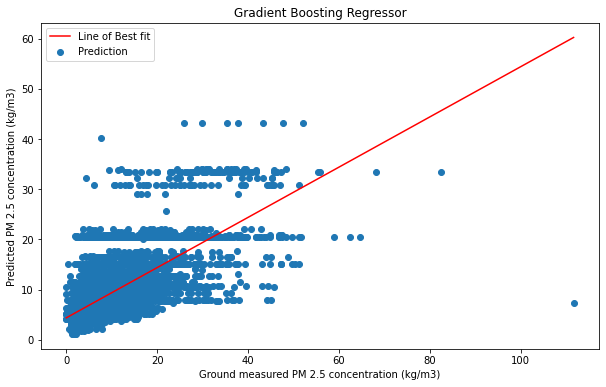

In [314]:
# # y_test_outlier = pd.DataFrame(y_test)
# # y_test_outlier = y_test_outlier.reset_index()
# y_pred_dtree = pd.DataFrame(y_pred_dtree, columns = ['Dtree'])
# dtree_outlier = pd.DataFrame.join(y_test_outlier, y_pred_dtree).reset_index()
# dtree_outlier = dtree_outlier.drop(['level_0', 'index'], axis = 1)
# dtree_outlier = dtree_outlier[dtree_outlier['PM25']< 80]

plt.figure(figsize =(10,6))
plt.scatter(dtree_outlier['PM25'], dtree_outlier['Dtree'], label = 'Prediction', cmap = 'inferno')
plt.plot(np.unique(dtree_outlier['PM25']), np.poly1d(np.polyfit(dtree_outlier['PM25'], dtree_outlier['Dtree'], 1))(np.unique(dtree_outlier['PM25'])), color = 'red', label = 'Line of Best fit')
plt.xlabel('Ground measured PM 2.5 concentration (kg/m3)')
plt.ylabel('Predicted PM 2.5 concentration (kg/m3)')
plt.title('Gradient Boosting Regressor')
plt.savefig('DTree.png')
plt.legend()

# Random Forest

In [44]:
pipe_forest = Pipeline([
        ('scale', StandardScaler()), ('forest', RandomForestRegressor())])
pipe_forest.get_params().keys()

dict_keys(['memory', 'steps', 'verbose', 'scale', 'forest', 'scale__copy', 'scale__with_mean', 'scale__with_std', 'forest__bootstrap', 'forest__ccp_alpha', 'forest__criterion', 'forest__max_depth', 'forest__max_features', 'forest__max_leaf_nodes', 'forest__max_samples', 'forest__min_impurity_decrease', 'forest__min_impurity_split', 'forest__min_samples_leaf', 'forest__min_samples_split', 'forest__min_weight_fraction_leaf', 'forest__n_estimators', 'forest__n_jobs', 'forest__oob_score', 'forest__random_state', 'forest__verbose', 'forest__warm_start'])

In [45]:
# Hypterparameter tuning was conducted using GridSearchCV
# The below parametrs were determined based on the results obtained from GridSearchCV
params = {'forest__n_estimators':[600]}

forest_search = GridSearchCV(pipe_forest,params,n_jobs=-1, cv=5,verbose=2)
forest_search.fit(X_train,y_train.values.ravel())

Fitting 5 folds for each of 1 candidates, totalling 5 fits


GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('scale', StandardScaler()),
                                       ('forest', RandomForestRegressor())]),
             n_jobs=-1, param_grid={'forest__n_estimators': [600]}, verbose=2)

In [46]:
print('Score on train data: {}\n'.format(forest_search.score(X_train, y_train.values.ravel())))
print('Best parameters found:')
display(forest_search.best_params_)

Score on train data: 0.9667822125899297

Best parameters found:


{'forest__n_estimators': 600}

In [47]:
print('best cv score:')
display(forest_search.best_score_)

print('mean cv score:')
display(np.mean(forest_search.cv_results_["mean_test_score"]))

best cv score:


0.7446893003624158

mean cv score:


0.7446893003624158

In [48]:
forest_best_estim = forest_search.best_estimator_
print(forest_best_estim)

Pipeline(steps=[('scale', StandardScaler()),
                ('forest', RandomForestRegressor(n_estimators=600))])


In [49]:
forest_best_estim.fit(X_train, y_train)

forest_ytrain_pred = forest_best_estim.predict(X_train)
forest_rmse = np.sqrt(mean_squared_error(forest_ytrain_pred,  y_train.values.ravel()))
forest_r2 = r2_score(forest_ytrain_pred,y_train.values.ravel())
print("RMSE: %.2f" % forest_rmse)
print("R2: %.2f" % forest_r2)

RMSE: 1.24
R2: 0.96


In [51]:
y_pred_rforest = forest_best_estim.predict(X_test)

In [52]:
y_pred_rforest_coord = forest_best_estim.predict(X_test_coord)

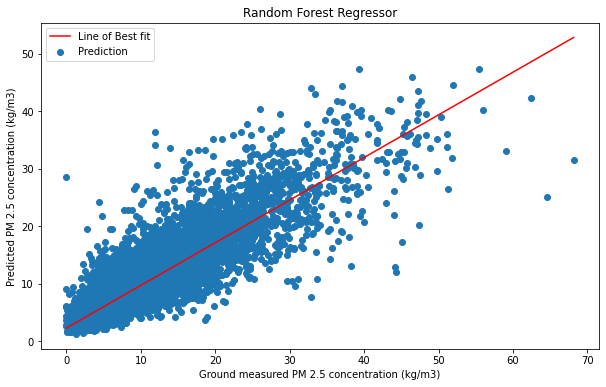

In [299]:
plt.figure(figsize =(10,6))
plt.scatter(rforest_outlier['PM25'], rforest_outlier['Rforest'], label = 'Prediction', cmap = 'inferno')
plt.plot(np.unique(rforest_outlier['PM25']), np.poly1d(np.polyfit(rforest_outlier['PM25'], rforest_outlier['Rforest'], 1))(np.unique(rforest_outlier['PM25'])), color = 'red', label = 'Line of Best fit')
plt.xlabel('Ground measured PM 2.5 concentration (kg/m3)')
plt.ylabel('Predicted PM 2.5 concentration (kg/m3)')
plt.title('Random Forest Regressor')
plt.savefig('RF.png')
plt.legend()


In [210]:
# y_test_outlier = pd.DataFrame(y_test)
# y_test_outlier = y_test_outlier.reset_index()
# y_pred_rforest = pd.DataFrame(y_pred_rforest)
# rforest_outlier = pd.DataFrame.join(y_test_outlier, y_pred_rforest_outlier)

# rforest_outlier = rforest_outlier.drop(8844).reset_index()
# rforest_outlier = rforest_outlier.drop('index', axis = 1)
rforest_outlier = rforest_outlier[rforest_outlier['PM25']< 80]

# Gradient Boosting Regressor

In [54]:
pipe_gboost = Pipeline([
        ('scale', StandardScaler()), ('gboost', GradientBoostingRegressor())])
pipe_gboost.get_params().keys()

dict_keys(['memory', 'steps', 'verbose', 'scale', 'gboost', 'scale__copy', 'scale__with_mean', 'scale__with_std', 'gboost__alpha', 'gboost__ccp_alpha', 'gboost__criterion', 'gboost__init', 'gboost__learning_rate', 'gboost__loss', 'gboost__max_depth', 'gboost__max_features', 'gboost__max_leaf_nodes', 'gboost__min_impurity_decrease', 'gboost__min_impurity_split', 'gboost__min_samples_leaf', 'gboost__min_samples_split', 'gboost__min_weight_fraction_leaf', 'gboost__n_estimators', 'gboost__n_iter_no_change', 'gboost__random_state', 'gboost__subsample', 'gboost__tol', 'gboost__validation_fraction', 'gboost__verbose', 'gboost__warm_start'])

In [55]:
# Hypterparameter tuning was conducted using GridSearchCV
# The below parametrs were determined based on the results obtained from GridSearchCV
params = {'gboost__learning_rate':[0.1],
         'gboost__max_depth':[10]}
gboost_search = GridSearchCV(pipe_gboost,params,n_jobs=-1,cv=5,verbose=2)
gboost_search.fit(X_train,y_train)

Fitting 5 folds for each of 1 candidates, totalling 5 fits


GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('scale', StandardScaler()),
                                       ('gboost',
                                        GradientBoostingRegressor())]),
             n_jobs=-1,
             param_grid={'gboost__learning_rate': [0.1],
                         'gboost__max_depth': [10]},
             verbose=2)

In [56]:
print('Score on train data: {}\n'.format(gboost_search.score(X_train,y_train)))
print('Best parameters found:')
display(gboost_search.best_params_)

Score on train data: 0.9450647897818107

Best parameters found:


{'gboost__learning_rate': 0.1, 'gboost__max_depth': 10}

In [57]:
print('best cv score:')
display(np.mean(gboost_search.best_score_))

print('mean cv score:')
display(np.mean(gboost_search.cv_results_["mean_test_score"]))

best cv score:


0.7643324076869918

mean cv score:


0.7643324076869918

In [58]:
gboost_best_estim = gboost_search.best_estimator_
print(gboost_best_estim)

Pipeline(steps=[('scale', StandardScaler()),
                ('gboost', GradientBoostingRegressor(max_depth=10))])


In [59]:
gboost_best_estim.fit(X_train, y_train)

gboost_ytrain_pred = gboost_best_estim.predict(X_train)
gboost_rmse = np.sqrt(mean_squared_error(gboost_ytrain_pred, y_train.values.ravel()))
gboost_r2 = r2_score(gboost_ytrain_pred,y_train.values.ravel())
print("RMSE: %.2f" % gboost_rmse)
print("R2: %.2f" % gboost_r2)

RMSE: 1.60
R2: 0.93


In [265]:
y_pred_gboost = gboost_best_estim.predict(X_test)

In [61]:
y_pred_gboost_coord = gboost_best_estim.predict(X_test_coord)

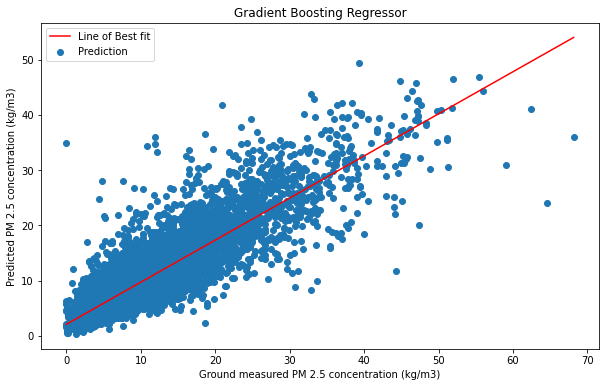

In [313]:
# y_test_outlier = pd.DataFrame(y_test)
# y_test_outlier = y_test_outlier.reset_index()
# y_pred_gboost = pd.DataFrame(y_pred_gboost, columns = ['Gboost'])
# gboost_outlier = pd.DataFrame.join(y_test_outlier, y_pred_gboost).reset_index()
# gboost_outlier = gboost_outlier.drop(['level_0', 'index'], axis = 1)
gboost_outlier = gboost_outlier[gboost_outlier['PM25']< 80]

plt.figure(figsize =(10,6))
plt.scatter(gboost_outlier['PM25'], gboost_outlier['Gboost'], label = 'Prediction', cmap = 'inferno')
plt.plot(np.unique(gboost_outlier['PM25']), np.poly1d(np.polyfit(gboost_outlier['PM25'], gboost_outlier['Gboost'], 1))(np.unique(gboost_outlier['PM25'])), color = 'red', label = 'Line of Best fit')
plt.xlabel('Ground measured PM 2.5 concentration (kg/m3)')
plt.ylabel('Predicted PM 2.5 concentration (kg/m3)')
plt.title('Gradient Boosting Regressor')
plt.savefig('GradientBoost.png')
plt.legend()

# XGBoost

In [62]:
pipe_xgb = Pipeline([
        ('scale', StandardScaler()), ('xgb', XGBRegressor(objective='reg:squarederror'))])
pipe_xgb.get_params().keys()

dict_keys(['memory', 'steps', 'verbose', 'scale', 'xgb', 'scale__copy', 'scale__with_mean', 'scale__with_std', 'xgb__objective', 'xgb__base_score', 'xgb__booster', 'xgb__colsample_bylevel', 'xgb__colsample_bynode', 'xgb__colsample_bytree', 'xgb__enable_categorical', 'xgb__gamma', 'xgb__gpu_id', 'xgb__importance_type', 'xgb__interaction_constraints', 'xgb__learning_rate', 'xgb__max_delta_step', 'xgb__max_depth', 'xgb__min_child_weight', 'xgb__missing', 'xgb__monotone_constraints', 'xgb__n_estimators', 'xgb__n_jobs', 'xgb__num_parallel_tree', 'xgb__predictor', 'xgb__random_state', 'xgb__reg_alpha', 'xgb__reg_lambda', 'xgb__scale_pos_weight', 'xgb__subsample', 'xgb__tree_method', 'xgb__validate_parameters', 'xgb__verbosity'])

In [63]:
# Hypterparameter tuning was conducted using GridSearchCV
# The below parametrs were determined based on the results obtained from GridSearchCV
params = {'xgb__learning_rate':[0.1],
         'xgb__max_depth': [11],
          'xgb__n_estimators':[1400],
         'xgb__reg_lambda': [1000]}
xgb_search = GridSearchCV(pipe_xgb,params,n_jobs=-1,cv=5,verbose=2)
xgb_search.fit(X_train,y_train)

Fitting 5 folds for each of 1 candidates, totalling 5 fits


GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('scale', StandardScaler()),
                                       ('xgb',
                                        XGBRegressor(base_score=None,
                                                     booster=None,
                                                     colsample_bylevel=None,
                                                     colsample_bynode=None,
                                                     colsample_bytree=None,
                                                     enable_categorical=False,
                                                     gamma=None, gpu_id=None,
                                                     importance_type=None,
                                                     interaction_constraints=None,
                                                     learning_rate=None,
                                                     max_delta_step=None,
                                      

In [64]:
print('Score on train data: {}\n'.format(xgb_search.score(X_train,y_train)))
print('Best parameters found:')
display(xgb_search.best_params_)

Score on train data: 0.9418522577074718

Best parameters found:


{'xgb__learning_rate': 0.1,
 'xgb__max_depth': 11,
 'xgb__n_estimators': 1400,
 'xgb__reg_lambda': 1000}

In [65]:
print('best cv score:')
display(xgb_search.best_score_)

print('mean cv score:')
display(np.mean(xgb_search.cv_results_["mean_test_score"]))

best cv score:


0.799668305249255

mean cv score:


0.799668305249255

In [66]:
xgb_best_estim = xgb_search.best_estimator_
print(xgb_best_estim)

Pipeline(steps=[('scale', StandardScaler()),
                ('xgb',
                 XGBRegressor(base_score=0.5, booster='gbtree',
                              colsample_bylevel=1, colsample_bynode=1,
                              colsample_bytree=1, enable_categorical=False,
                              gamma=0, gpu_id=-1, importance_type=None,
                              interaction_constraints='', learning_rate=0.1,
                              max_delta_step=0, max_depth=11,
                              min_child_weight=1, missing=nan,
                              monotone_constraints='()', n_estimators=1400,
                              n_jobs=16, num_parallel_tree=1, predictor='auto',
                              random_state=0, reg_alpha=0, reg_lambda=1000,
                              scale_pos_weight=1, subsample=1,
                              tree_method='exact', validate_parameters=1,
                              verbosity=None))])


In [67]:
xgb_best_estim.fit(X_train, y_train)

xgb_ytrain_pred = xgb_best_estim.predict(X_train)
xgb_rmse = np.sqrt(mean_squared_error(xgb_ytrain_pred, y_train))
xgb_r2 = r2_score(xgb_ytrain_pred,y_train)
print("RMSE: %.2f" % xgb_rmse)
print("R2: %.2f" % xgb_r2)

RMSE: 1.64
R2: 0.93


In [68]:
y_pred_xgb = xgb_best_estim.predict(X_test)

In [69]:
y_pred_xgb_coord = xgb_best_estim.predict(X_test_coord)

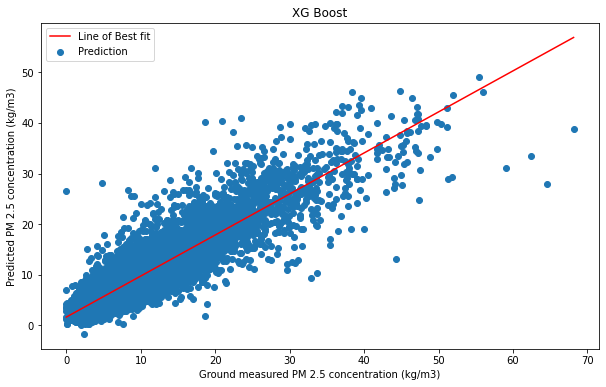

In [315]:
y_test_outlier = pd.DataFrame(y_test)
y_test_outlier = y_test_outlier.reset_index()
y_pred_xgb = pd.DataFrame(y_pred_xgb, columns = ['XGB'])
xgb_outlier = pd.DataFrame.join(y_test_outlier, y_pred_xgb).reset_index()
xgb_outlier = xgb_outlier.drop(['level_0', 'index'], axis = 1)
xgb_outlier = xgb_outlier[xgb_outlier['PM25']< 80]

plt.figure(figsize =(10,6))
plt.scatter(xgb_outlier['PM25'], xgb_outlier['XGB'], label = 'Prediction', cmap = 'inferno')
plt.plot(np.unique(xgb_outlier['PM25']), np.poly1d(np.polyfit(xgb_outlier['PM25'], xgb_outlier['XGB'], 1))(np.unique(xgb_outlier['PM25'])), color = 'red', label = 'Line of Best fit')
plt.xlabel('Ground measured PM 2.5 concentration (kg/m3)')
plt.ylabel('Predicted PM 2.5 concentration (kg/m3)')
plt.title('XG Boost')
plt.savefig('XGBoost.png')
plt.legend()

# LightGBM

In [72]:
pipe_LGBM = Pipeline([
        ('scale', StandardScaler()), ('LGBM', LGBMRegressor())])
pipe_LGBM.get_params().keys()

dict_keys(['memory', 'steps', 'verbose', 'scale', 'LGBM', 'scale__copy', 'scale__with_mean', 'scale__with_std', 'LGBM__boosting_type', 'LGBM__class_weight', 'LGBM__colsample_bytree', 'LGBM__importance_type', 'LGBM__learning_rate', 'LGBM__max_depth', 'LGBM__min_child_samples', 'LGBM__min_child_weight', 'LGBM__min_split_gain', 'LGBM__n_estimators', 'LGBM__n_jobs', 'LGBM__num_leaves', 'LGBM__objective', 'LGBM__random_state', 'LGBM__reg_alpha', 'LGBM__reg_lambda', 'LGBM__silent', 'LGBM__subsample', 'LGBM__subsample_for_bin', 'LGBM__subsample_freq'])

In [73]:
# Hypterparameter tuning was conducted using GridSearchCV
# Parametrs were determined based on the results obtained from GridSearchCV
params = {'LGBM__max_depth': [20],
          'LGBM__learning_rate':[0.1],
          'LGBM__num_leaves':[400],
          'LGBM__reg_lambda':[500],
          'LGBM__n_estimators': [800]
         }
LGBM_search = GridSearchCV(pipe_LGBM,params,n_jobs=-1,cv=5,verbose=2)
LGBM_search.fit(X_train,y_train.values.ravel())

Fitting 5 folds for each of 1 candidates, totalling 5 fits


GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('scale', StandardScaler()),
                                       ('LGBM', LGBMRegressor())]),
             n_jobs=-1,
             param_grid={'LGBM__learning_rate': [0.1], 'LGBM__max_depth': [20],
                         'LGBM__n_estimators': [800], 'LGBM__num_leaves': [400],
                         'LGBM__reg_lambda': [500]},
             verbose=2)

In [74]:
print('Score on train data: {}\n'.format(LGBM_search.score(X_train,y_train.values.ravel())))
print('Best parameters found:')
display(LGBM_search.best_params_)

Score on train data: 0.9678899980838152

Best parameters found:


{'LGBM__learning_rate': 0.1,
 'LGBM__max_depth': 20,
 'LGBM__n_estimators': 800,
 'LGBM__num_leaves': 400,
 'LGBM__reg_lambda': 500}

In [75]:
print('best cv score:')
display(LGBM_search.best_score_)

print('mean cv score:')
display(np.mean(LGBM_search.cv_results_["mean_test_score"]))

best cv score:


0.8115033885945753

mean cv score:


0.8115033885945753

In [76]:
LGBM_best_estim = LGBM_search.best_estimator_
print(LGBM_best_estim)

Pipeline(steps=[('scale', StandardScaler()),
                ('LGBM',
                 LGBMRegressor(max_depth=20, n_estimators=800, num_leaves=400,
                               reg_lambda=500))])


In [77]:
LGBM_best_estim.fit(X_train, y_train)

LGBM_ytrain_pred = LGBM_best_estim.predict(X_train)
LGBM_rmse = np.sqrt(mean_squared_error(LGBM_ytrain_pred, y_train))
LGBM_r2 = r2_score(LGBM_ytrain_pred,y_train)
print("RMSE: %.2f" % LGBM_rmse)
print("R2: %.2f" % LGBM_r2)

RMSE: 1.22
R2: 0.96


In [78]:
y_pred_lgb = LGBM_best_estim.predict(X_test)

In [79]:
y_pred_lgb_coord = LGBM_best_estim.predict(X_test_coord)

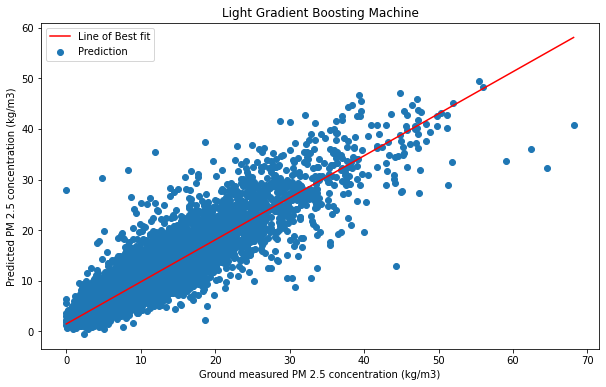

In [296]:
# y_test_outlier = pd.DataFrame(y_test)
# y_test_outlier = y_test_outlier.reset_index()
# y_pred_lgb = pd.DataFrame(y_pred_lgb, columns = ['LGBM'])
# lgb_outlier = pd.DataFrame.join(y_test_outlier, y_pred_lgb).reset_index()
# lgb_outlier = lgb_outlier.drop(['level_0', 'index'], axis = 1)
# lgb_outlier = lgb_outlier[lgb_outlier['PM25']< 80]

plt.figure(figsize =(10,6))
plt.scatter(lgb_outlier['PM25'], lgb_outlier['LGBM'], label = 'Prediction', cmap = 'inferno')
plt.plot(np.unique(lgb_outlier['PM25']), np.poly1d(np.polyfit(lgb_outlier['PM25'], lgb_outlier['LGBM'], 1))(np.unique(lgb_outlier['PM25'])), color = 'red', label = 'Line of Best fit')
plt.xlabel('Ground measured PM 2.5 concentration (kg/m3)')
plt.ylabel('Predicted PM 2.5 concentration (kg/m3)')
plt.title('Light Gradient Boosting Machine')
plt.savefig('LGBM.png')
plt.legend()

In [116]:
!pip install plotly

In [117]:
from plotly import __version__

In [134]:
import plotly.express as px

In [118]:
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

In [123]:
init_notebook_mode(connected=True)

In [129]:
!pip install cufflinks

  Created wheel for cufflinks: filename=cufflinks-0.17.3-py3-none-any.whl size=68734 sha256=3bf6273130cd8c8e6515299a90e7b8f56b2e094b3d6f403c47e14446adb0fb80
  Stored in directory: c:\users\zenudeen\appdata\local\pip\cache\wheels\29\b4\f8\2fd2206eeeba6ccad8167e4e8894b8c4ec27bf1342037fd136
Successfully built cufflinks


In [130]:
import cufflinks as cf
cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)

In [126]:
%matplotlib inline

# Correlations

In [230]:
# Predictions for each model

predict_pm25_rforest = pd.DataFrame(y_pred_rforest_coord, columns = ['Predict Rforest'])
predict_pm25_gboost = pd.DataFrame(y_pred_gboost_coord, columns = ['Predict Gboost'])
predict_pm25_xgb = pd.DataFrame(y_pred_xgb_coord, columns = ['Predict XGB'])
predict_pm25_lgb = pd.DataFrame(y_pred_lgb_coord, columns = ['Predict LGBM'])

In [231]:
respiratory = [749,721,797,935,926,610,845,708,554,680,655,652,736,553,585,
618,637,711,823,639,806,808,1087,689,651,681,628,615,608,676,619,573,835,733,
733,896,681,941,863,600,567,739,850,852,859,]
respiratory_disease = pd.DataFrame(respiratory, columns = ['Respiratory'])

asthma = [75,34,49,72,69,45,42,49,43,45,42,53,48,34,38,38,46,59,63,32,58,45,85,
39,36,37,40,41,36,33,32,37,52,66,45,51,42,62,49,35,31,46,49,61,47]
asthma_df = pd.DataFrame(asthma, columns = ['Asthma'])

copd = [130,117,214,229,205,90,194,115,90,111,110,106,157,79,94,115,93,165,110,
105,121,103,196,116,116,1136,103,122,101,100,81,88,192,142,144,191,140,192,163,112,88,136,159,177,161]
copd_df = pd.DataFrame(copd, columns = ['COPD'])

In [232]:
coordinates = pd.read_csv('Coordinates_updated_long.csv')
correlation = pd.DataFrame.join(predict_pm25_rforest, predict_pm25_gboost)
correlation = correlation.join(predict_pm25_xgb)
correlation = correlation.join(predict_pm25_lgb)
correlation = correlation.join(coordinates['location'])


In [233]:
correlation_groupby = correlation.groupby('location',sort = False, as_index=False).mean(lambda x: set(x))

In [234]:
correlation_groupby = correlation_groupby.join(respiratory_disease)
correlation_groupby = correlation_groupby.join(asthma_df)
correlation_groupby = correlation_groupby.join(copd_df)

In [235]:
correlation_groupby.head()

,location,Predict Rforest,Predict Gboost,Predict XGB,Predict LGBM,Respiratory,Asthma,COPD
0,Northumberland,4.547102,4.250059,2.972733,3.735427,749,75,130
1,North Cumbria & Morecambe Bay,3.314092,3.802117,3.437628,3.479859,721,34,117
2,County Durham,4.420191,4.016880,4.092578,4.284545,797,49,214
3,"Newcastle, Tyneside & Sunderland",6.051340,5.748931,4.318401,4.860389,935,72,229
4,Tees Valley,6.211090,6.487400,6.237060,7.266259,926,69,205


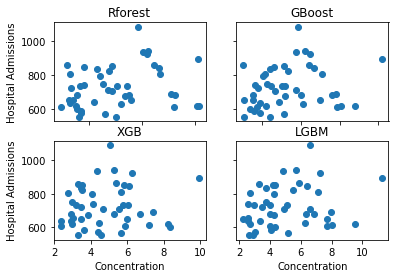

<Figure size 1080x504 with 0 Axes>

In [236]:
fig, axs = plt.subplots(2, 2)
plt.figure(figsize = (15,7))

axs[0, 0].scatter(correlation_groupby['Predict Rforest'], correlation_groupby['Respiratory'] )
axs[0, 0].set_title('Rforest')
axs[0, 1].scatter(correlation_groupby['Predict Gboost'], correlation_groupby['Respiratory'] )
axs[0, 1].set_title('GBoost')
axs[1, 0].scatter(correlation_groupby['Predict XGB'], correlation_groupby['Respiratory'] )
axs[1, 0].set_title('XGB')
axs[1, 1].scatter(correlation_groupby['Predict LGBM'], correlation_groupby['Respiratory'])
axs[1, 1].set_title('LGBM')

for ax in axs.flat:
    ax.set(xlabel='Concentration', ylabel='Hospital Admissions')

# Hide x labels and tick labels for top plots and y ticks for right plots.
for ax in axs.flat:
    ax.label_outer()

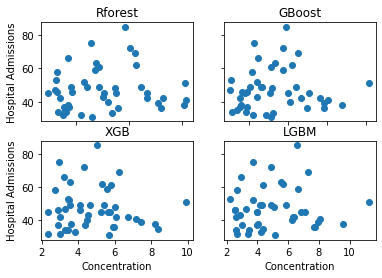

<Figure size 1080x504 with 0 Axes>

In [237]:
fig, axs = plt.subplots(2, 2)
plt.figure(figsize = (15,7))

axs[0, 0].scatter(correlation_groupby['Predict Rforest'], correlation_groupby['Asthma'] )
axs[0, 0].set_title('Rforest')
axs[0, 1].scatter(correlation_groupby['Predict Gboost'], correlation_groupby['Asthma'] )
axs[0, 1].set_title('GBoost')
axs[1, 0].scatter(correlation_groupby['Predict XGB'], correlation_groupby['Asthma'] )
axs[1, 0].set_title('XGB')
axs[1, 1].scatter(correlation_groupby['Predict LGBM'], correlation_groupby['Asthma'])
axs[1, 1].set_title('LGBM')

for ax in axs.flat:
    ax.set(xlabel='Concentration', ylabel='Hospital Admissions')

# Hide x labels and tick labels for top plots and y ticks for right plots.
for ax in axs.flat:
    ax.label_outer()

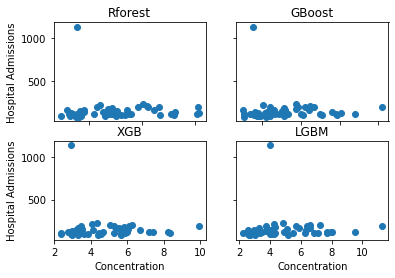

<Figure size 1080x504 with 0 Axes>

In [238]:
fig, axs = plt.subplots(2, 2)
plt.figure(figsize = (15,7))

axs[0, 0].scatter(correlation_groupby['Predict Rforest'], correlation_groupby['COPD'] )
axs[0, 0].set_title('Rforest')
axs[0, 1].scatter(correlation_groupby['Predict Gboost'], correlation_groupby['COPD'] )
axs[0, 1].set_title('GBoost')
axs[1, 0].scatter(correlation_groupby['Predict XGB'], correlation_groupby['COPD'] )
axs[1, 0].set_title('XGB')
axs[1, 1].scatter(correlation_groupby['Predict LGBM'], correlation_groupby['COPD'])
axs[1, 1].set_title('LGBM')

for ax in axs.flat:
    ax.set(xlabel='Concentration', ylabel='Hospital Admissions')

# Hide x labels and tick labels for top plots and y ticks for right plots.
for ax in axs.flat:
    ax.label_outer()

In [239]:
from scipy.stats import pearsonr


print('Rforest, Asthma:', pearsonr(correlation_groupby['Predict Rforest'],
         correlation_groupby['Asthma'])[0])
print('GBoost, Asthma:', pearsonr(correlation_groupby['Predict Gboost'],
         correlation_groupby['Asthma'])[0])
print('XGB, Asthma:', pearsonr(correlation_groupby['Predict XGB'],
         correlation_groupby['Asthma'])[0])
print('LGBM, Asthma:', pearsonr(correlation_groupby['Predict LGBM'],
         correlation_groupby['Asthma'])[0])

Rforest, Asthma: 0.07609339525201728
GBoost, Asthma: 0.04110018714067045
XGB, Asthma: -0.06298342639295951
LGBM, Asthma: 0.049646346873252166


In [ ]:
# Plots

# - table satellite data - Done
# - table with NHS data - Done
# - Bands, mission, ground resolution - Done
# - Statistical plots on NHS, distribution - Done
# - PM2.5 & PM10 predictions for YOI - Done
# - We have yearly data, would be better to have monthly - Done
# - Plot of feature importance for ML model 
# - Training
# - Table of RMSE and accuracy of all ML models - Done
# - UK boundaries - Done
# - Correlation plots - Done
# - FLow chart - Done
# - Remove outliers - Done